In [1]:
!hostname

cheyenne6


In [2]:
!qstat -wnu $USER

In [3]:
import xarray as xr
import cartopy.crs as ccrs
import numpy as np
from scipy import signal 

from datetime import datetime, timedelta

import matplotlib.pyplot as plt

from utility_programs.read_routines.GITM import auto_read as auto_read_gitm
from  utility_programs.read_routines.SAMI import auto_read as auto_read_sami
import utility_programs.filters as filters

from utility_programs import plotting_routines
from utility_programs import utils

import gc
import pandas as pd
from tqdm.auto import tqdm
import glob, os

import importlib

/glade/work/abukowski/conda-envs/SAMI3-GITM/lib/python3.10/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:13: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [4]:

t_11 = datetime(2011,11,20)
t_05 = datetime(2011, 5,20)

t_start0 = timedelta(days=1) # Delta from t_start
t_end0 = timedelta(days=2)     #  in hours


indata = '/glade/u/home/abukowski/scratch/tmp/rho_edens_datasets'

In [5]:
def get_fit(array, lowcut=80, highcut=40):
    
    return xr.apply_ufunc(filters.make_fits, array.load(), lowcut, highcut)

def get_diffs(array, lowcut=80, highcut=40):
    return 100*(array - get_fit(array, lowcut, highcut))/array

In [6]:

afewtimes = [10, 20, 30, 40, 50, 60, 70, 80]

t_start_normal = 10
t_start_ut6 = 4
t_start_ut18 = 16

alts = [225, 400, 660, 850]

lons = np.linspace(0, 360, 7)[:-1]

lonlatalt = [
    [0, 50, 550],
    [180 + 50, 40, 150],
    [180, 35, 250],
    [60, 40, 650],
    [300, -20, 450],
    [300, 20, 450],
    [300, 40, 500],
    [300, -40, 500],
    [320, 45, 200],
    [320, 45, 400],
    [320, 45, 600],
    [320, -45, 200],
    [320, -45, 400],
    [320, -45, 600]]

gitmcol = ['Rho']
samicol = ['edens']

In [7]:
gitmcol + samicol

['Rho', 'edens']

In [8]:
# Just want to make an example time_list. 
# Can & should be changed in the future.


times = []
t = t_05
max_dtime = t_05 + timedelta(days=7)
while t < max_dtime:
    times.append(t)
    t+=timedelta(minutes=5)
times = np.array(times)

start_idx = np.argmin(np.abs(times - (t_05 + t_start0)))
end_idx = np.argmin(np.abs(times - (t_05 + t_end0)))

In [9]:
experiments = {'amp': ['full', 'half', 'quarter'],
               'rotB': ['bz17', 'bz15-byneg', 'bz15-bypos', 'bz8-bypos', 'bz8-byneg'],
               'newut': ['ut6', 'ut18', 'full'],
               '1hr':['1hr-full','1hr-ut6','1hr-half']}

In [10]:
fnames = []
dictkeys = []

for file in os.listdir(indata):
    last_dash = file.rfind('-')+1
    first_dash = file.find('-')
    model = file[last_dash:]
    month = file[:first_dash]
    run = file[first_dash+1:last_dash-1]
    exp = [k for k in experiments.keys() if run in experiments[k]]
    
    fnames.append(os.path.join(indata, file))
    
    dictkeys.append([exp, month, run, model])
    
    # print(month, exp, run, model)

In [11]:
dictkeys

[[['newut'], 'nov', 'ut18', 'sami'],
 [['amp'], 'nov', 'half', 'gitm'],
 [['amp'], 'may', 'quarter', 'sami'],
 [['newut'], 'may', 'ut18', 'gitm'],
 [['amp', 'newut'], 'nov', 'full', 'gitm'],
 [['rotB'], 'nov', 'bz17', 'gitm'],
 [['newut'], 'nov', 'ut18', 'gitm'],
 [['amp', 'newut'], 'may', 'full', 'sami'],
 [['newut'], 'may', 'ut6', 'gitm'],
 [['amp', 'newut'], 'may', 'full', 'gitm'],
 [['rotB'], 'nov', 'bz15-byneg', 'gitm'],
 [['rotB'], 'nov', 'bz8-bypos', 'sami'],
 [['rotB'], 'nov', 'bz8-byneg', 'gitm'],
 [['amp', 'newut'], 'nov', 'full', 'sami'],
 [['rotB'], 'nov', 'bz17', 'sami'],
 [['1hr'], 'may', '1hr-ut6', 'gitm'],
 [['amp'], 'may', 'half', 'gitm'],
 [['newut'], 'may', 'ut6', 'sami'],
 [['newut'], 'nov', 'ut6', 'sami'],
 [['newut'], 'may', 'ut18', 'sami'],
 [['1hr'], 'may', '1hr-half', 'gitm'],
 [['rotB'], 'nov', 'bz15-byneg', 'sami'],
 [['newut'], 'nov', 'ut6', 'gitm'],
 [['rotB'], 'nov', 'bz8-bypos', 'gitm'],
 [['rotB'], 'nov', 'bz8-byneg', 'sami'],
 [['rotB'], 'nov', 'bz15-by

In [12]:
lookup_table = {}
data = {}

for n, [exps, month, run, model] in enumerate(dictkeys):
    for exp in exps:
        if month in fnames[n] and run in fnames[n] and model in fnames[n]:
            pass
        else:
            raise ValueError('not found')
        try:
            data[exp][month][run][model] = xr.open_dataset(os.path.join(indata, fnames[n]))
        except KeyError:
            try:
                data[exp][month][run] = {model:xr.open_dataset(os.path.join(indata, fnames[n]))}
            except KeyError:
                try:
                    data[exp][month] = {run:{model:xr.open_dataset(os.path.join(indata, fnames[n]))}}
                    lookup_table[exp][month] = {run:model}
                except KeyError:
                    try:
                        data[exp] = {month:{run:{model:xr.open_dataset(os.path.join(indata, fnames[n]))}}}
                        lookup_table[exp] = {month:{run:model}}
                    except KeyError:
                        print(exp, month, run, model)

In [13]:
lookup_table

{'newut': {'nov': {'ut18': 'sami'}, 'may': {'ut18': 'gitm'}},
 'amp': {'nov': {'half': 'gitm'}, 'may': {'quarter': 'sami'}},
 'rotB': {'nov': {'bz17': 'gitm'}},
 '1hr': {'may': {'1hr-ut6': 'gitm'}}}

In [14]:
data_lookup = []

for exp in data.keys():
    for mn in data[exp].keys():
        print(exp, mn, ':    runs=', list(data[exp][mn].keys()))
        data_lookup.append([exp, mn, 'runs=', list(data[exp][mn].keys())])

newut nov :    runs= ['ut18', 'full', 'ut6']
newut may :    runs= ['ut18', 'full', 'ut6']
amp nov :    runs= ['half', 'full']
amp may :    runs= ['quarter', 'full', 'half']
rotB nov :    runs= ['bz17', 'bz15-byneg', 'bz8-bypos', 'bz8-byneg', 'bz15-bypos']
1hr may :    runs= ['1hr-ut6', '1hr-half', '1hr-full']


In [15]:
data_lookup

[['newut', 'nov', 'runs=', ['ut18', 'full', 'ut6']],
 ['newut', 'may', 'runs=', ['ut18', 'full', 'ut6']],
 ['amp', 'nov', 'runs=', ['half', 'full']],
 ['amp', 'may', 'runs=', ['quarter', 'full', 'half']],
 ['rotB',
  'nov',
  'runs=',
  ['bz17', 'bz15-byneg', 'bz8-bypos', 'bz8-byneg', 'bz15-bypos']],
 ['1hr', 'may', 'runs=', ['1hr-ut6', '1hr-half', '1hr-full']]]

## Couple of Keograms:

In [28]:
plotting_routines = importlib.reload(plotting_routines)

/glade/u/home/abukowski/SAMI3-GITM-python/utility_programs/plotting_routines.py:7: FutureWarning: The geopandas.dataset module is deprecated and will be removed in GeoPandas 1.0. You can get the original 'naturalearth_lowres' data from https://www.naturalearthdata.com/downloads/110m-cultural-vectors/.
  world = geopandas.read_file(geopandas.datasets.get_path("naturalearth_lowres"))


In [18]:
data_lookup


[['newut', 'nov', 'runs=', ['ut18', 'full', 'ut6']],
 ['newut', 'may', 'runs=', ['ut18', 'full', 'ut6']],
 ['amp', 'nov', 'runs=', ['half', 'full']],
 ['amp', 'may', 'runs=', ['quarter', 'full', 'half']],
 ['rotB',
  'nov',
  'runs=',
  ['bz17', 'bz15-byneg', 'bz8-bypos', 'bz8-byneg', 'bz15-bypos']],
 ['1hr', 'may', 'runs=', ['1hr-ut6', '1hr-half', '1hr-full']]]

ut18


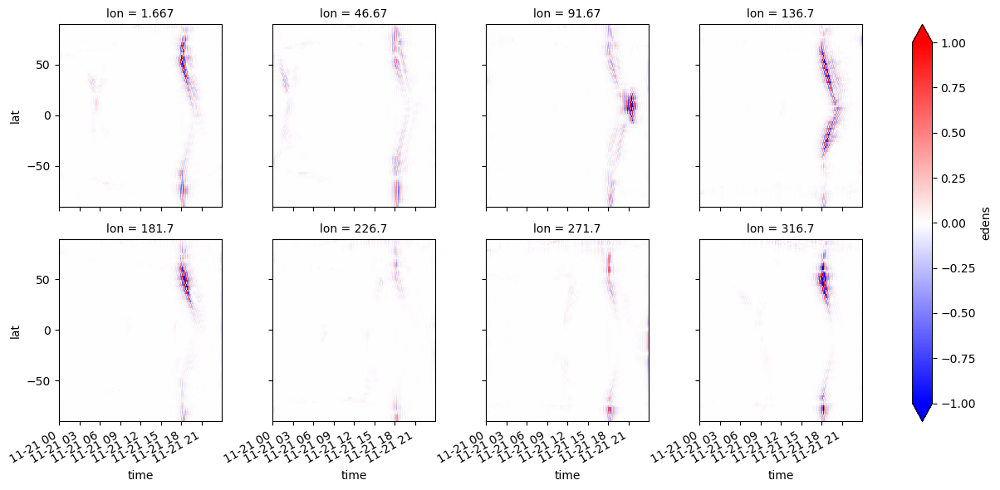

full


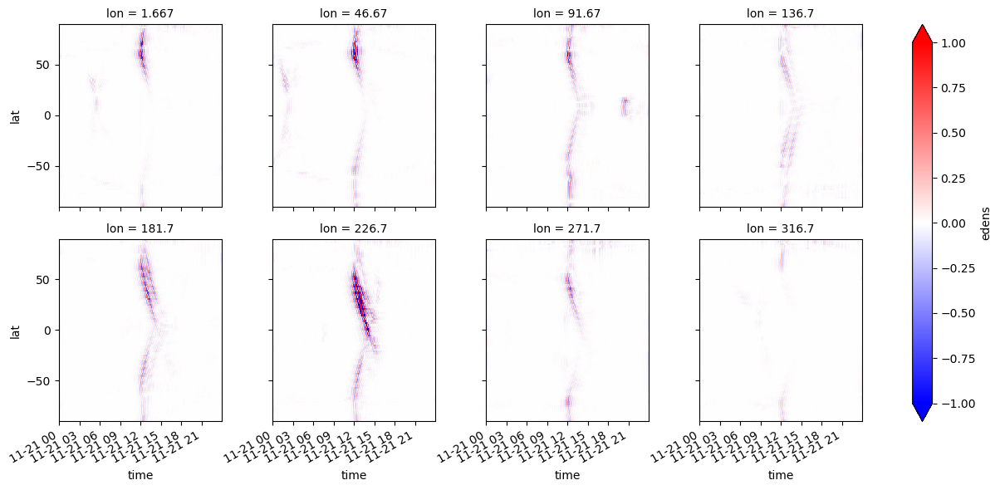

ut6


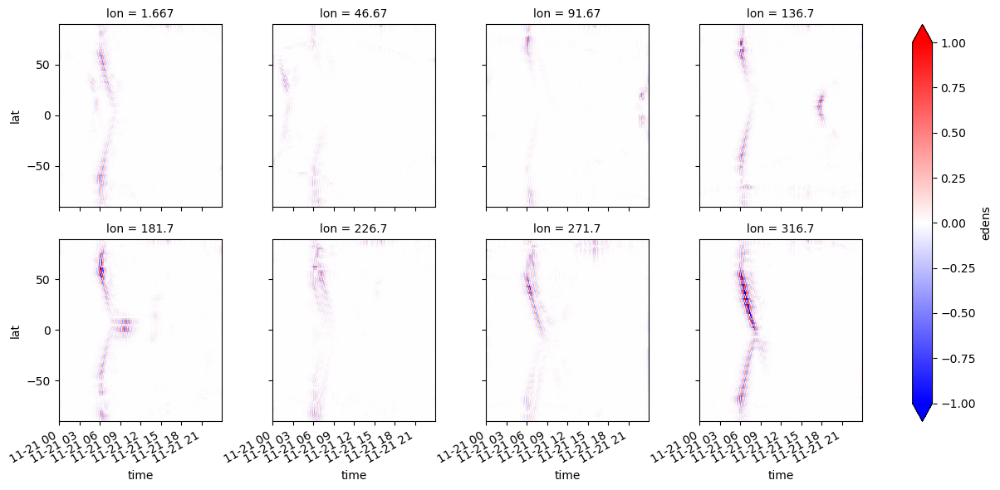

In [81]:
for run in data['newut']['nov'].keys():
    print(run)
    plotting_routines.panel_plot(get_diffs(data['newut']['nov'][run]['sami'].sel(alt=650, method='nearest').edens),
                                 vlims = 1, col_wrap=4)


ut18


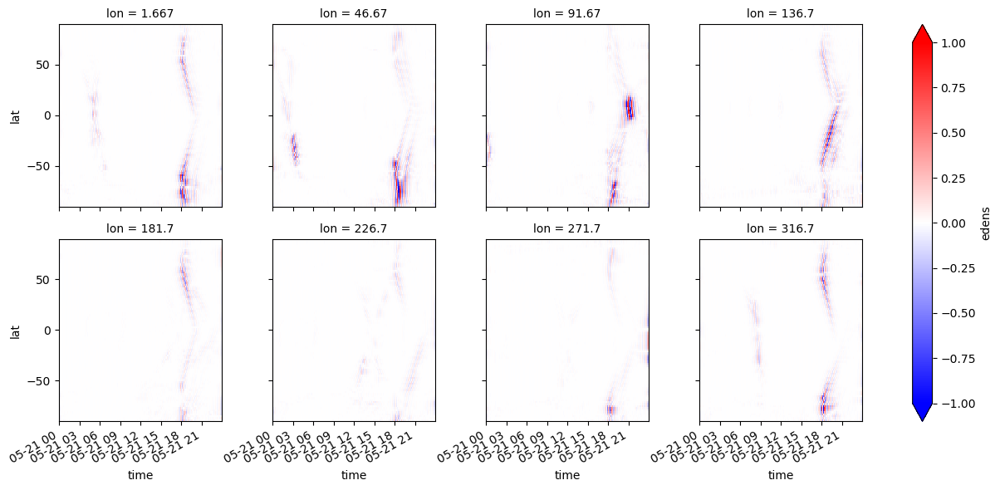

full


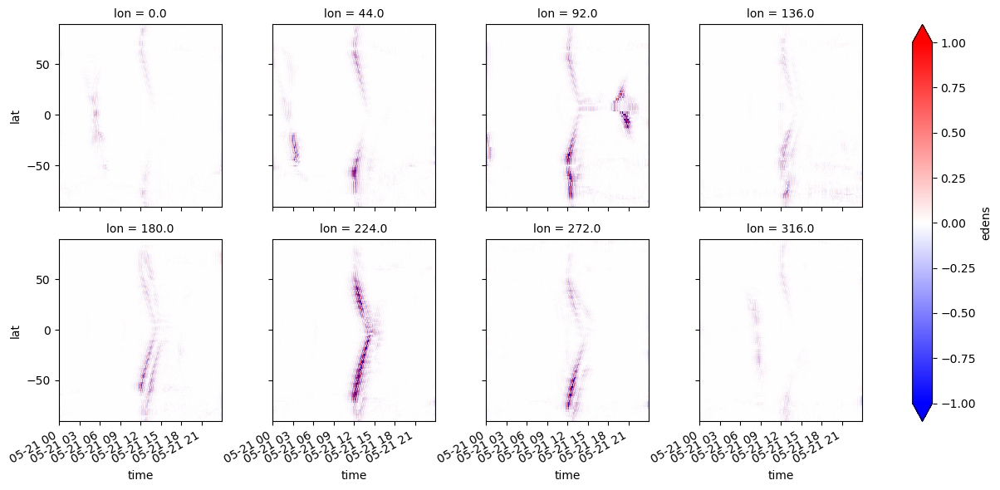

ut6


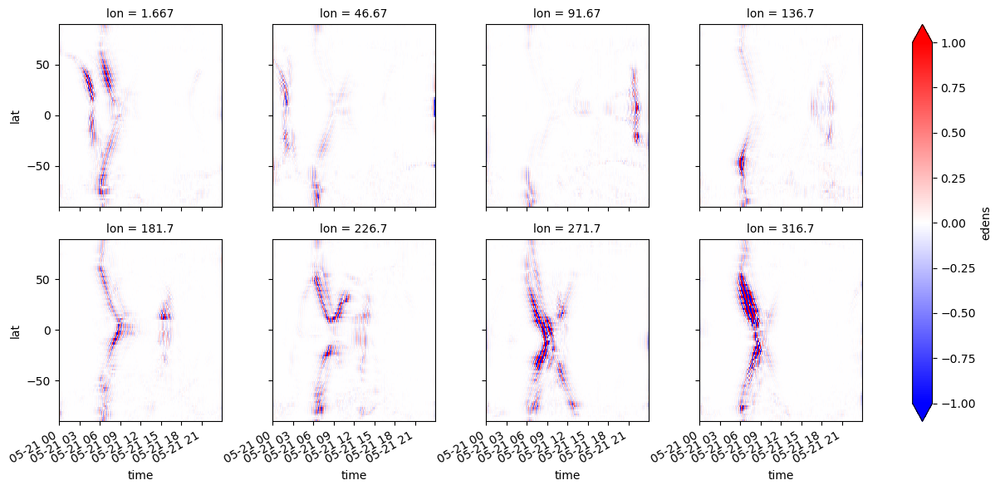

In [82]:
for run in data['newut']['may'].keys():
    print(run)
    plotting_routines.panel_plot(get_diffs(data['newut']['may'][run]['sami'].sel(alt=650, method='nearest').edens),
                                 vlims = 1, col_wrap=4)

bz17


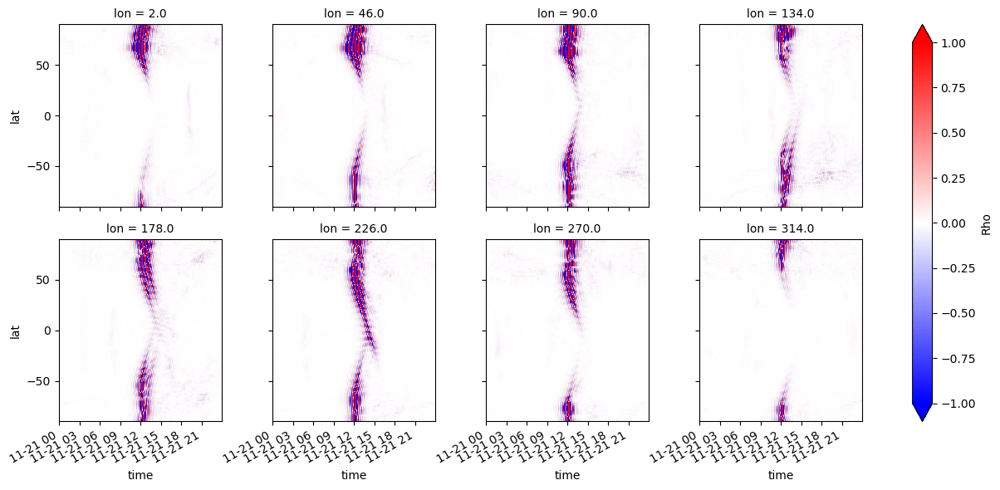

bz15-byneg


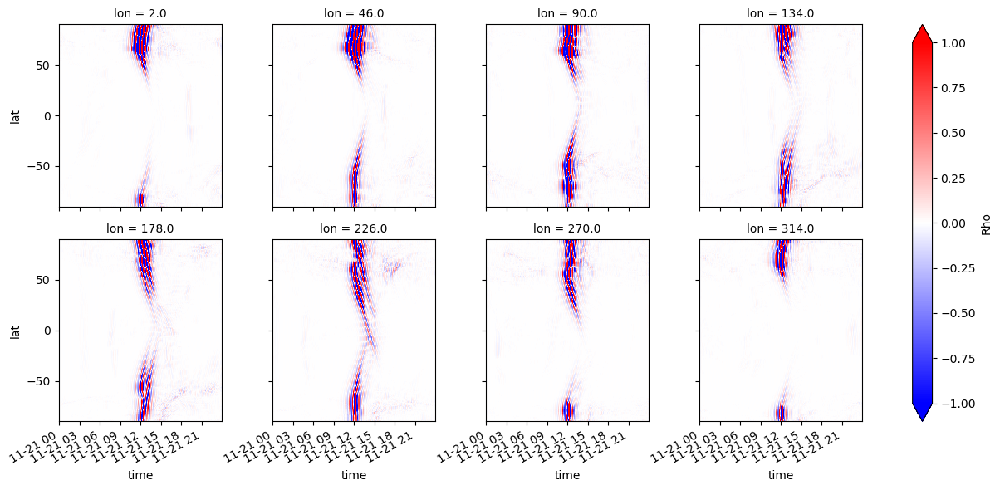

bz8-bypos


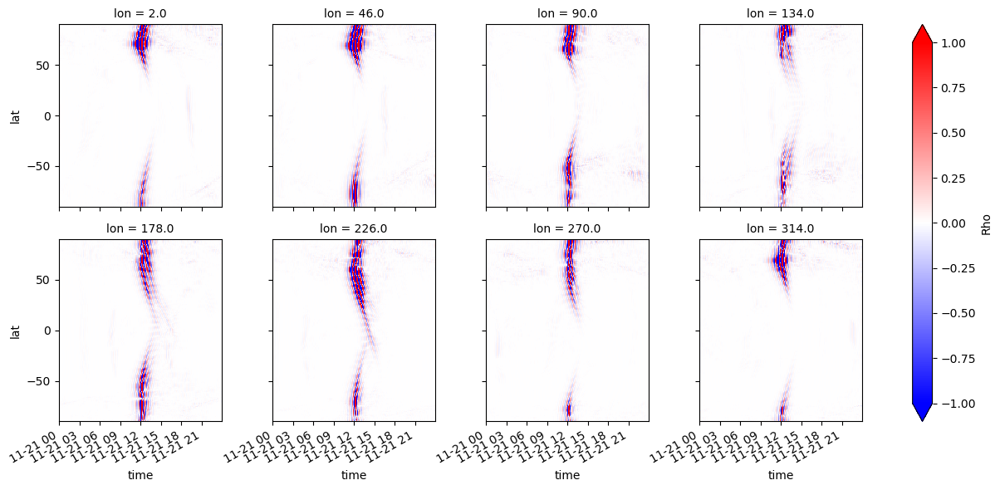

bz8-byneg


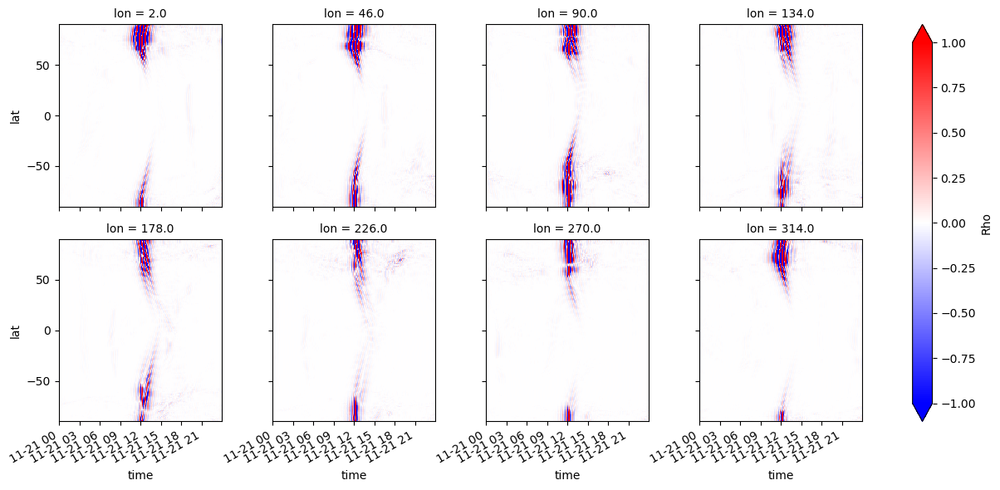

bz15-bypos


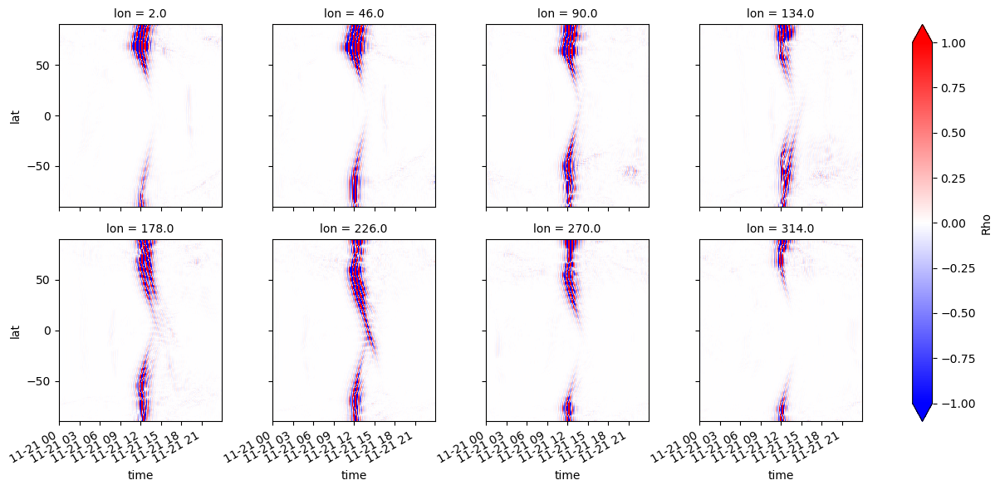

In [105]:
for run in data['rotB']['nov'].keys():
    print(run)
    plotting_routines.panel_plot(get_diffs(data['rotB']['nov'][run]['gitm'].sel(alt=650, method='nearest').Rho),
                                 vlims = 1, col_wrap = 4)


bz17


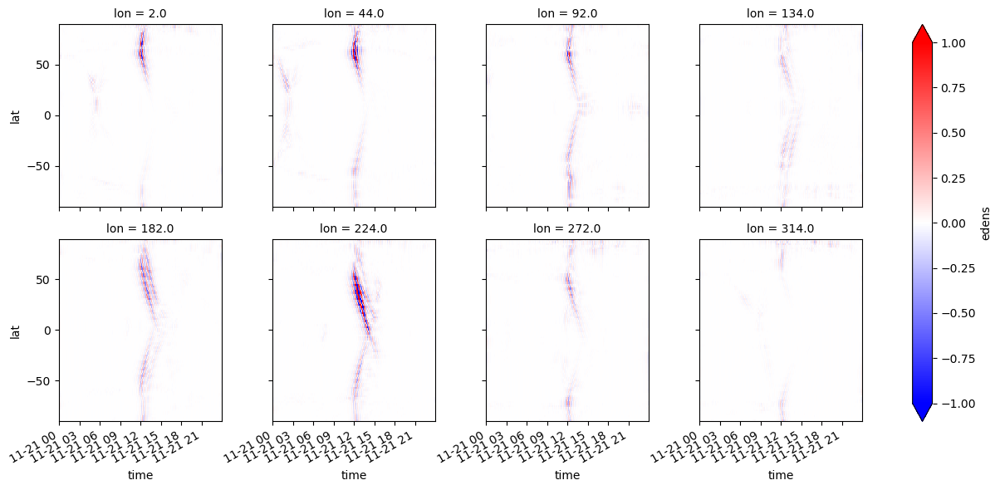

bz15-byneg


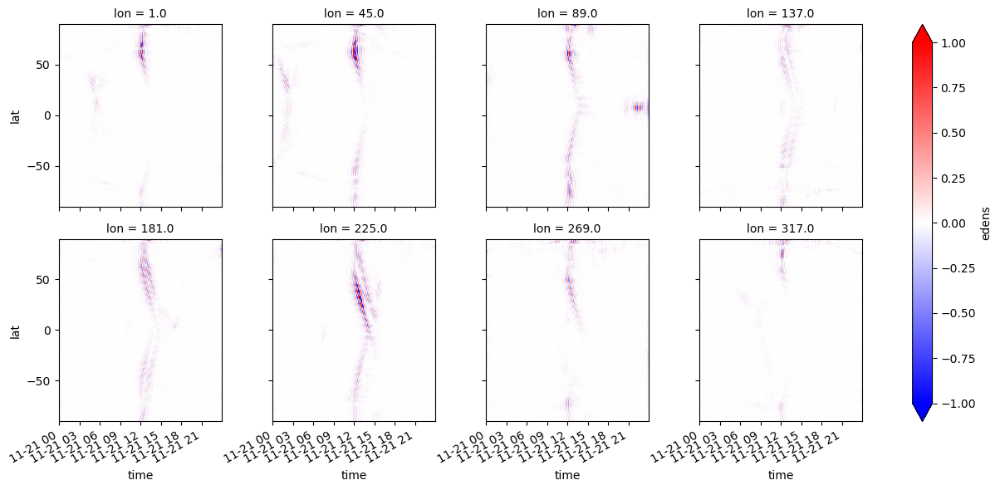

bz8-bypos


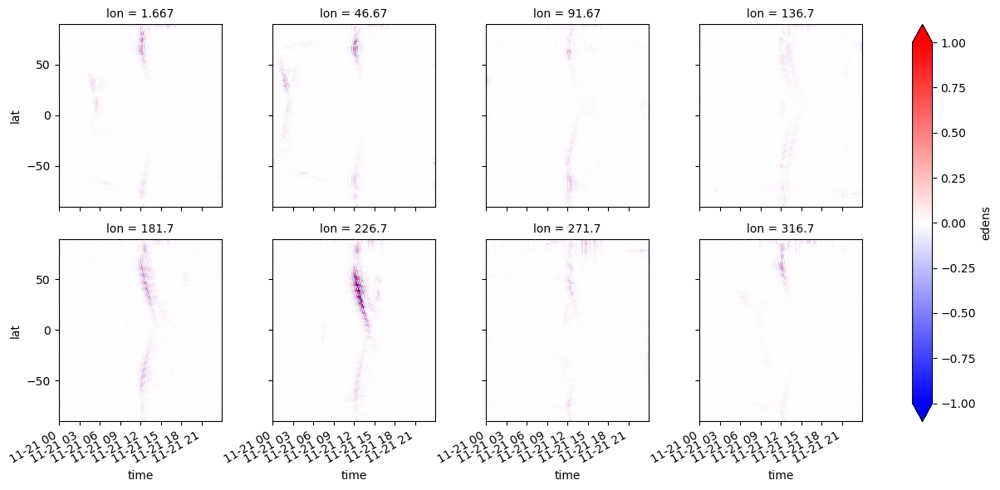

bz8-byneg


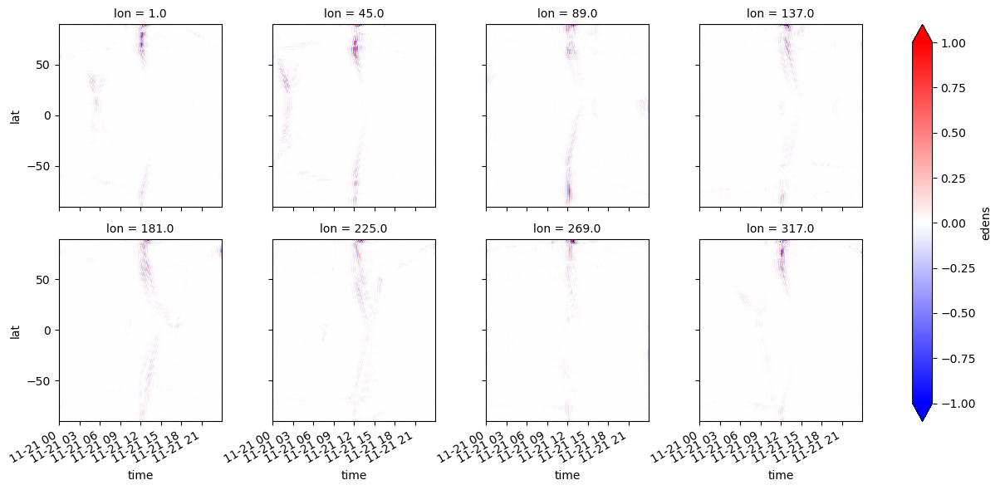

bz15-bypos


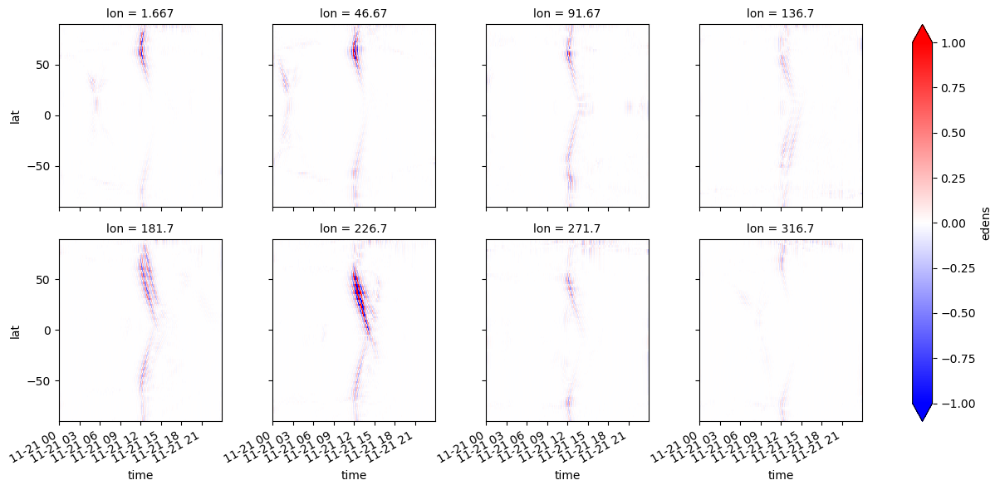

In [17]:
for run in data['rotB']['nov'].keys():
    print(run)
    plotting_routines.panel_plot(get_diffs(data['rotB']['nov'][run]['sami'].sel(alt=650, method='nearest').edens),
                                 vlims = 1, col_wrap = 4)
    

In [ ]:
5+5

['bz15-byneg', 'bz15-bypos']


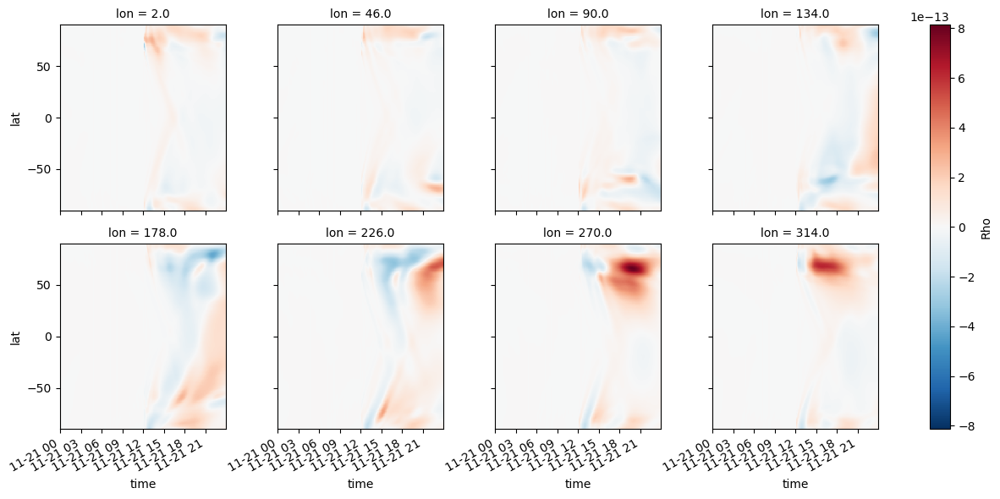

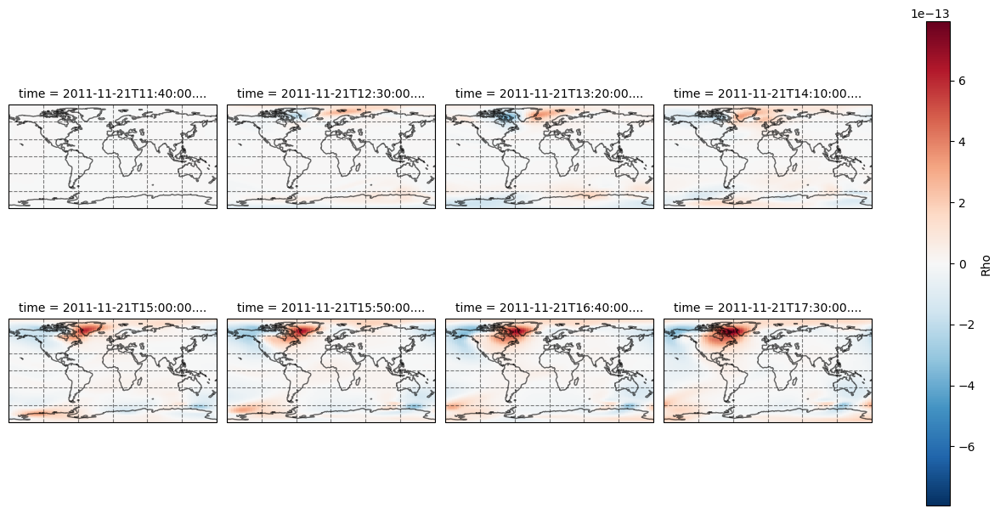

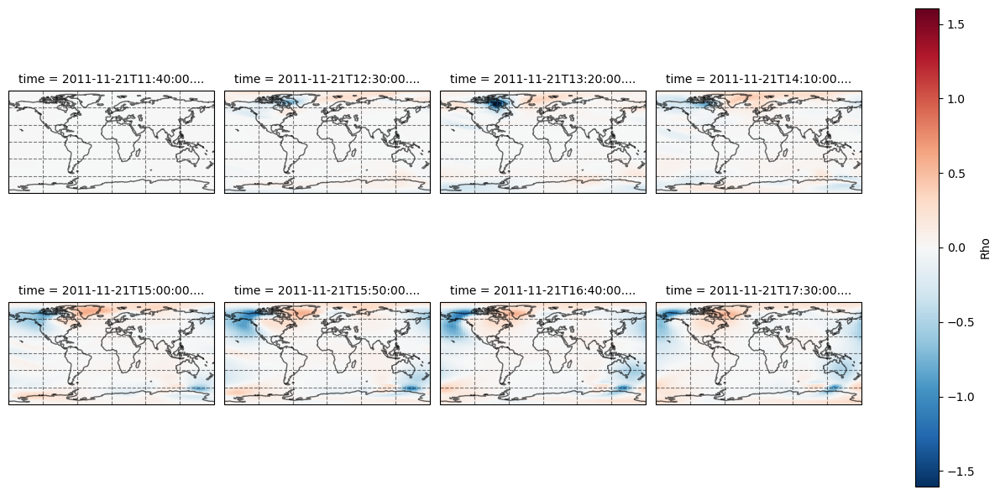

['bz8-byneg', 'bz8-bypos']


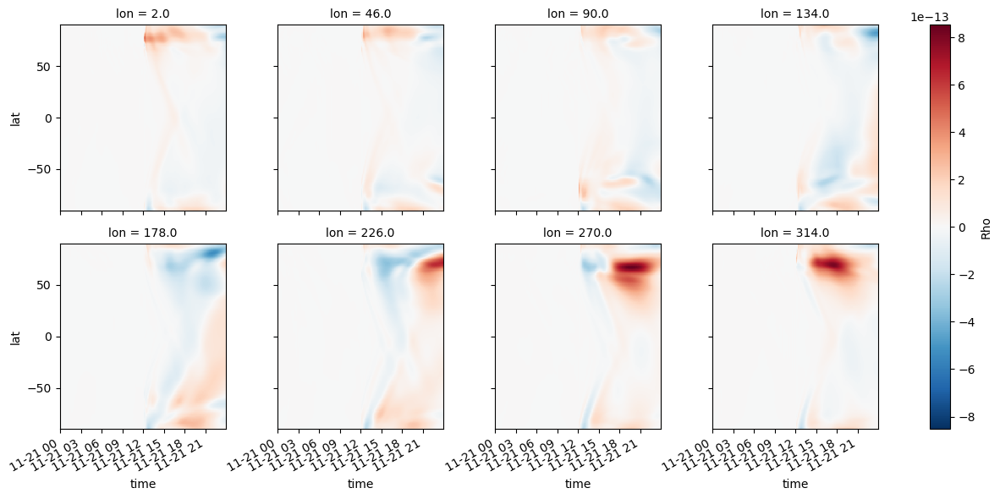

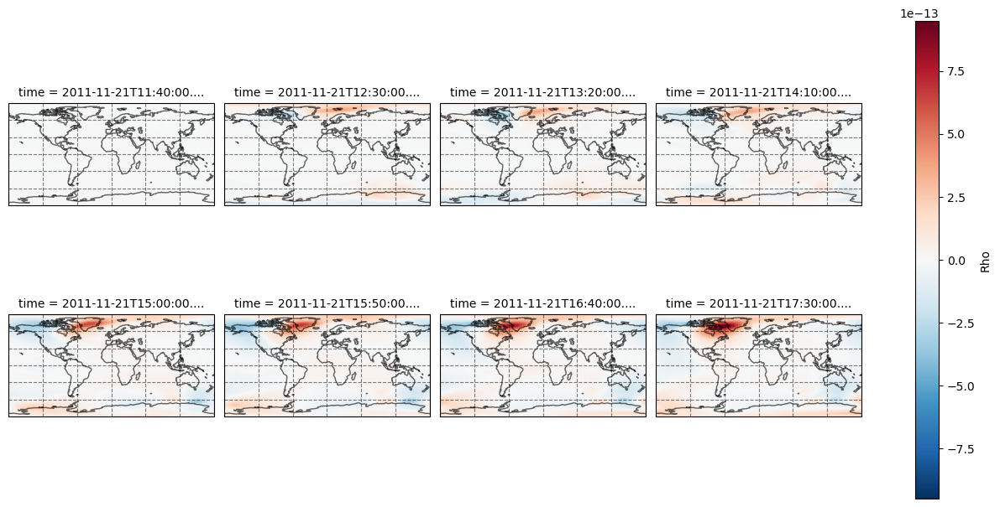

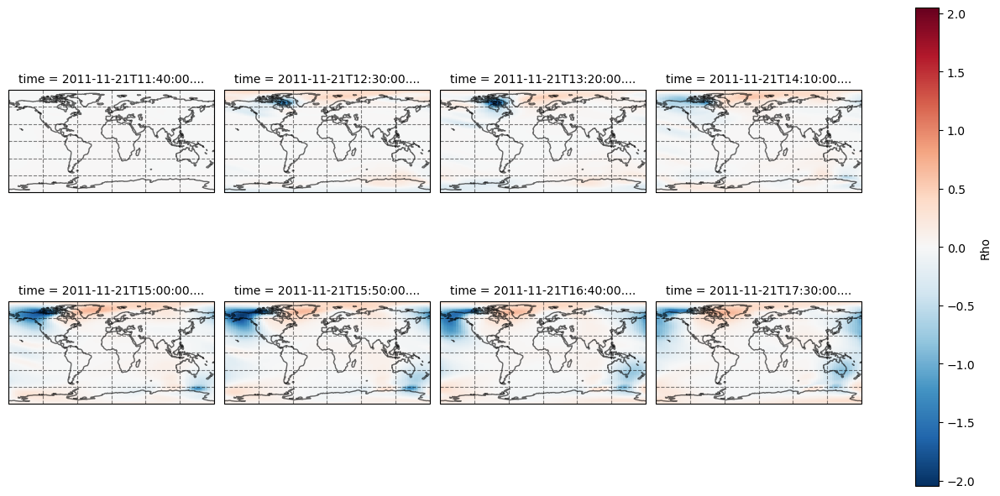

In [15]:
runs = [['bz15-byneg', 'bz15-bypos'], ['bz8-byneg', 'bz8-bypos']]
for run in runs:
    print(run)
    data['rotB']['nov'][run[0]]['gitm']['time'] = data['rotB']['nov'][run[1]]['gitm']['time']
    a = data['rotB']['nov'][run[0]]['gitm'].sel(alt=650, method='nearest').Rho.copy()\
                                 - data['rotB']['nov'][run[1]]['gitm'].sel(alt=650, method='nearest').Rho.copy()
    
    a.sel(lon=[2,46,90,134,178,226,270,314], method='nearest').plot(x='time', y='lat', col='lon', col_wrap=4)
    plt.show()
    plt.close()
    
    
    p=a.isel(time=np.array(afewtimes)+130).plot(x='lon', y='lat', col='time', col_wrap=4, transform=ccrs.PlateCarree(),
            subplot_kws={"projection": ccrs.PlateCarree(),
                         },)
    for ax in p.axs.flatten():
        ax.coastlines(alpha=0.6)
        ax.gridlines(color='black', alpha=0.5, linestyle='--')
    plt.show()
    plt.close()
    
    p=(a/data['rotB']['nov'][run[0]]['gitm'].Rho.sel(alt=650, method='nearest')).isel(
        time=np.array(afewtimes)+130).plot(
        x='lon', y='lat', col='time', col_wrap=4, transform=ccrs.PlateCarree(),
            subplot_kws={"projection": ccrs.PlateCarree(),
                         },)
    for ax in p.axs.flatten():
        ax.coastlines(alpha=0.6)
        ax.gridlines(color='black', alpha=0.5, linestyle='--')
    plt.show()
    plt.close()
    
    # break

In [111]:
lonlatalt = [[271, 45, 650],
            [2,50,555],
            [330,40,655],
            [330,40,450],
            [330,40,250]]

In [168]:
plotvar = 'edens'
exp = 'newut'
month='may'

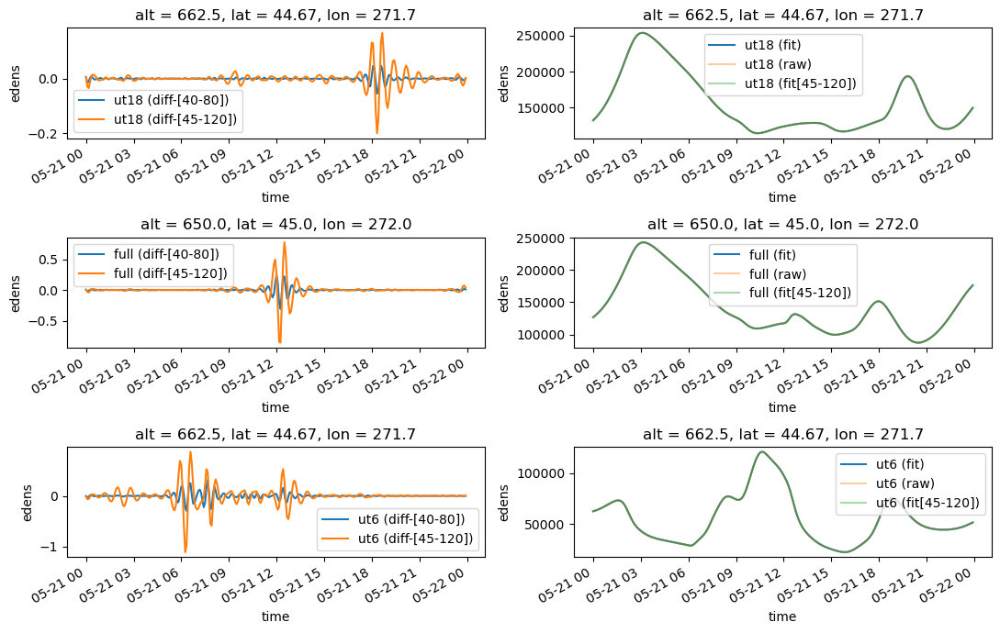

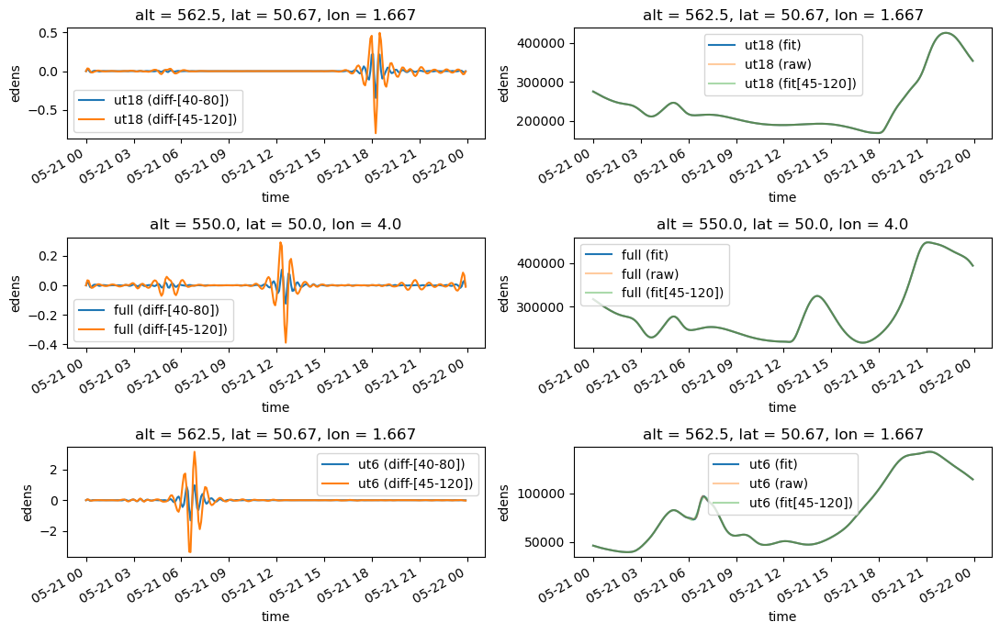

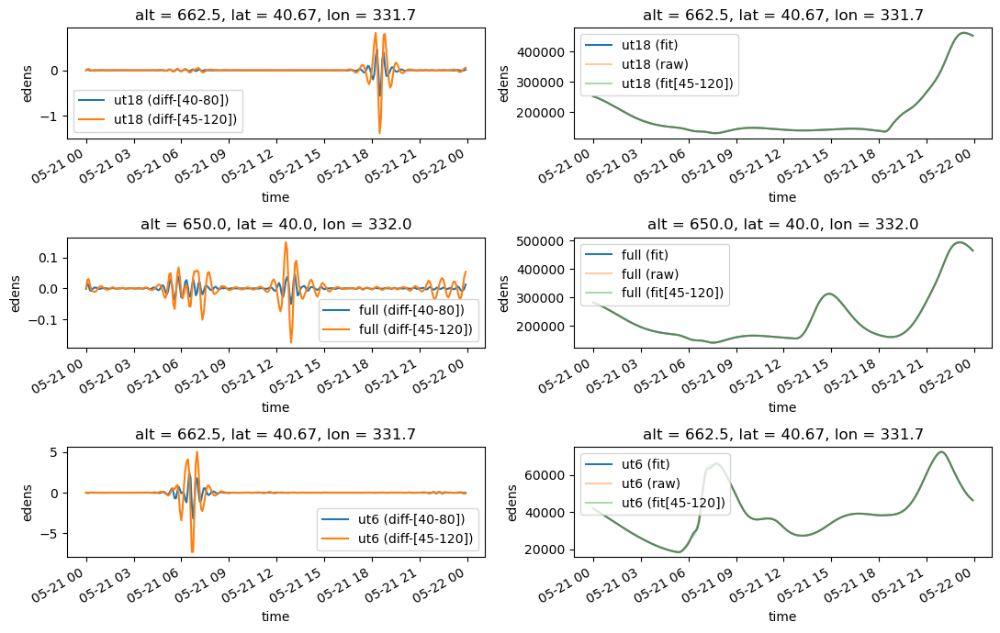

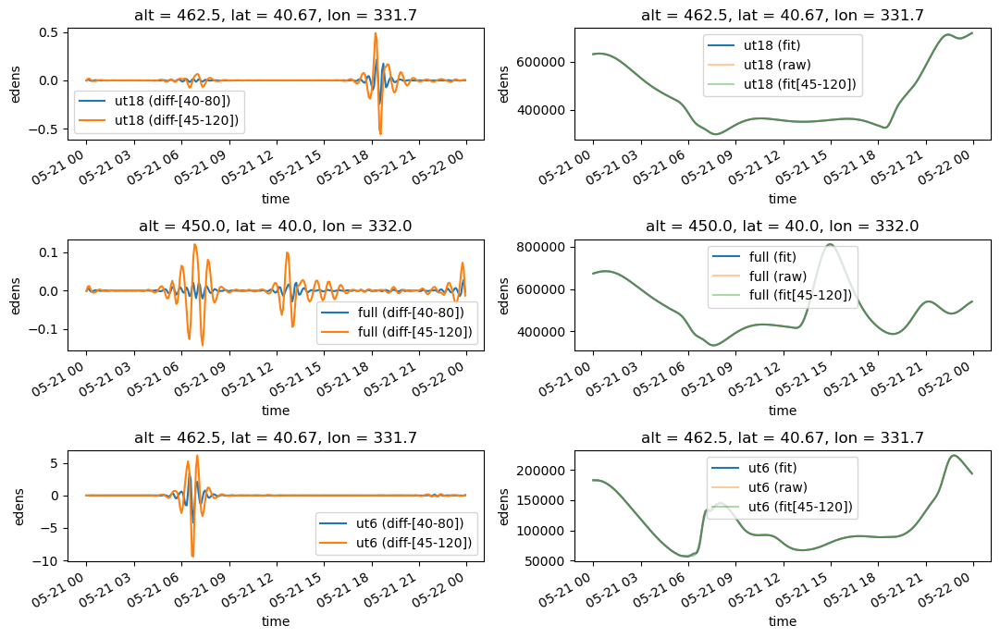

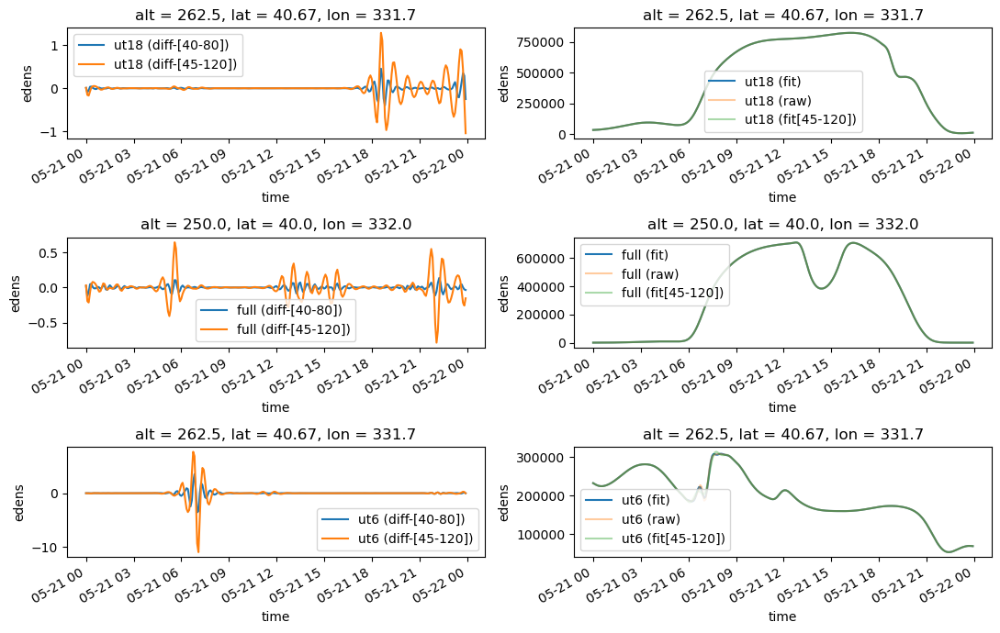

In [169]:
for pt in lonlatalt:
    rows = data[exp][month].keys()
    ilon, ilat, ialt = pt
    fig, axs = plt.subplots(nrows=len(rows), ncols=2,
                            figsize=(11, 1 + len(rows) * 2),)
    
    model = 'gitm' if plotvar in data[exp][mn][list(rows)[0]] else 'sami'


    for row, run in enumerate(rows):
        get_diffs(data[exp][month][run][model][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 0], label=str(run) + ' (diff-[40-80])')
        
        get_diffs(data[exp][month][run][model][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'), lowcut=120,highcut=45).plot(
            ax=axs[row, 0], label=str(run) + ' (diff-[45-120])')

        
        
        
        get_fit(data[exp][month][run][model][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 1], label=str(run) + ' (fit)')
                
        data[exp][month][run][model][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest').plot(
            ax=axs[row, 1], label=str(run) + ' (raw)', alpha = 0.4)
                
        get_fit(data[exp][month][run][model][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'), lowcut=120,highcut=45).plot(
            ax=axs[row, 1], label=str(run) + ' (fit[45-120])', alpha = 0.4)
        
    for ax in axs.flatten():
        ax.legend()
    fig.tight_layout()  
    plt.show()

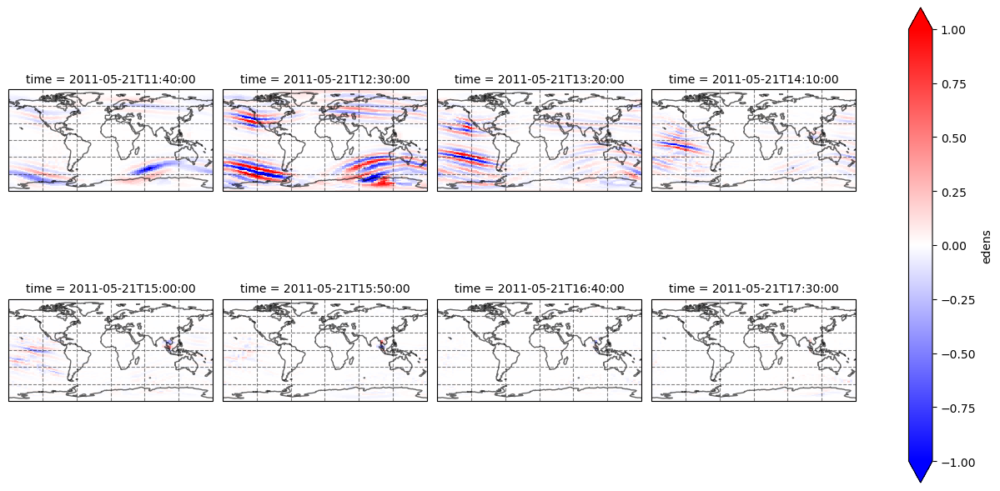

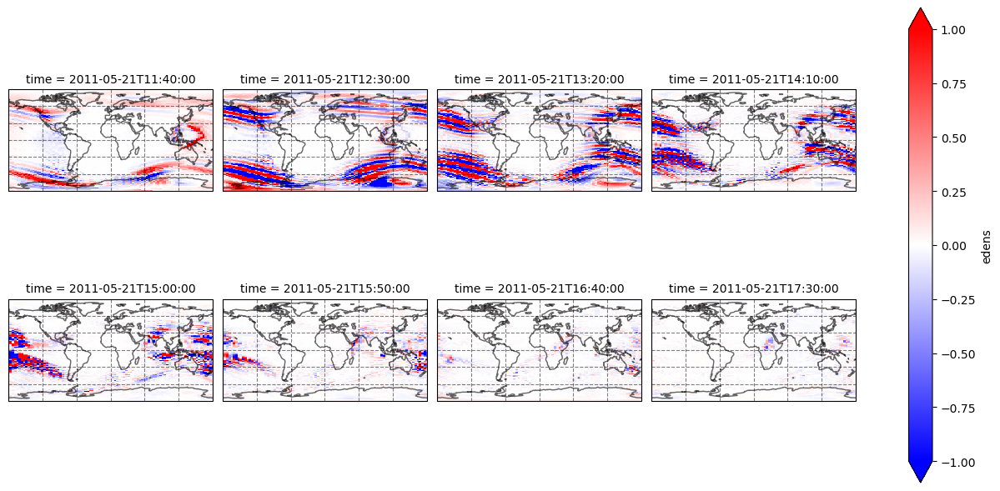

In [173]:
plotting_routines.panel_plot(get_diffs(data[exp][month]['full'][model][plotvar].sel(alt=650, method='nearest')),
                                 vlims = 1, col_wrap = 4, do_map=True, isel_plotvals=True,
                            wrap_col='time', plot_vals=np.array(afewtimes)+130, x='lon', y='lat')

plotting_routines.panel_plot(get_diffs(data[exp][month]['full'][model][plotvar].sel(alt=250, method='nearest')),
                                 vlims = 1, col_wrap = 4, do_map=True, isel_plotvals=True,
                            wrap_col='time', plot_vals=np.array(afewtimes)+130, x='lon', y='lat')

In [31]:
data_lookup

[['newut', 'nov', 'runs=', ['ut18', 'full', 'ut6']],
 ['newut', 'may', 'runs=', ['ut18', 'full', 'ut6']],
 ['amp', 'nov', 'runs=', ['half', 'full']],
 ['amp', 'may', 'runs=', ['quarter', 'full', 'half']],
 ['rotB',
  'nov',
  'runs=',
  ['bz17', 'bz15-byneg', 'bz8-bypos', 'bz8-byneg', 'bz15-bypos']],
 ['1hr', 'may', 'runs=', ['1hr-ut6', '1hr-half', '1hr-full']]]

In [32]:
plotvar = 'Rho'
exp = '1hr'
month='may'


model = 'gitm'

1hr-ut6


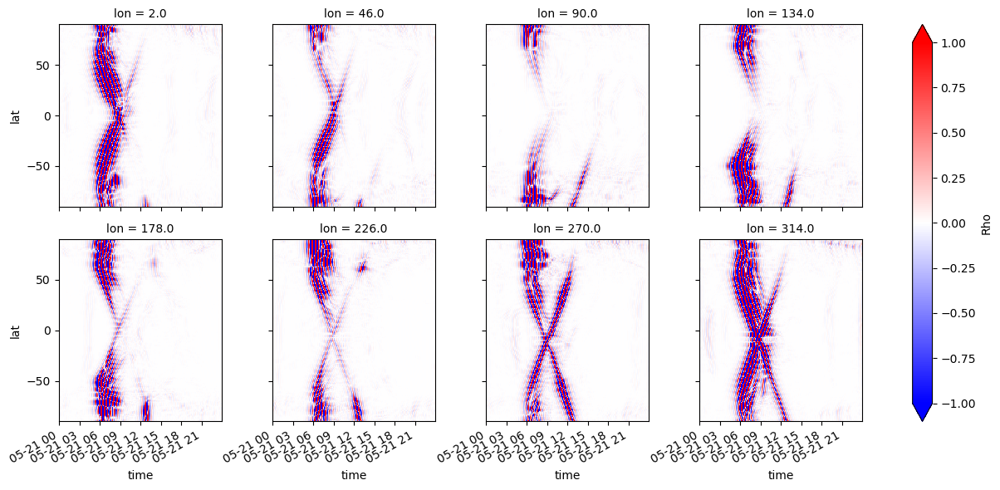

1hr-half


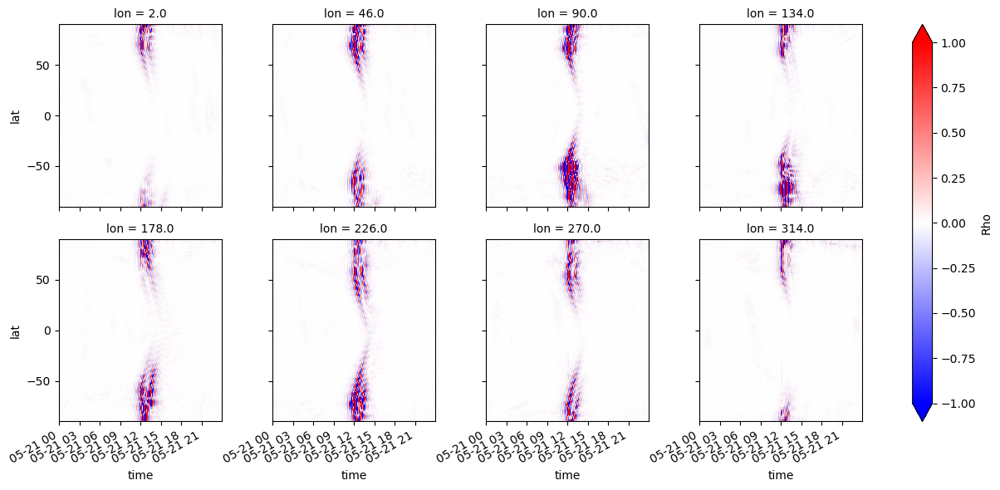

1hr-full


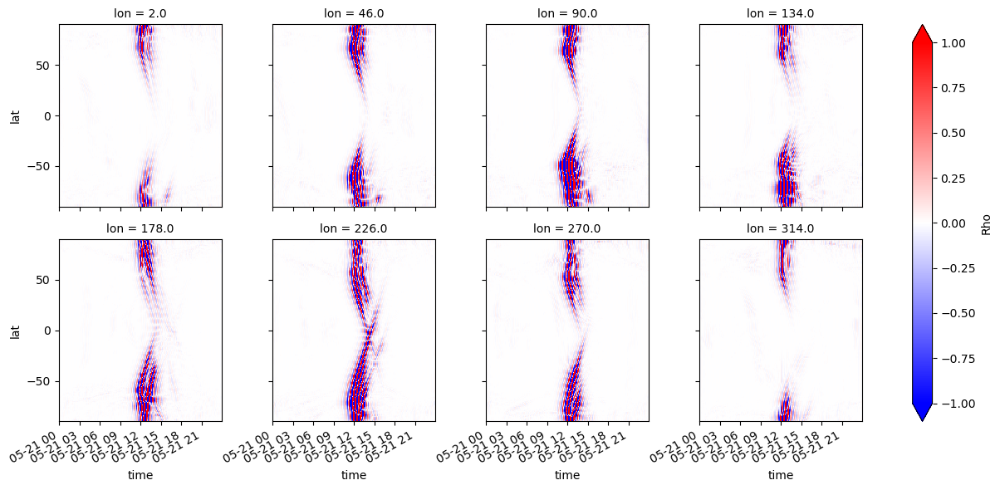

In [33]:
for run in data[exp][month].keys():
    print(run)
    # plotting_routines.panel_plot(get_diffs(data[exp][month][run][model][plotvar].sel(alt=550, method='nearest')),
    #                              vlims = 1, col_wrap = 4, do_map=True, isel_plotvals=True,
    #                         wrap_col='time', plot_vals=np.array(afewtimes)+130, x='lon', y='lat')

    plotting_routines.panel_plot(get_diffs(data[exp][month][run]['gitm'][plotvar].sel(alt=650, method='nearest')),
                                 vlims = 1, col_wrap = 4)


In [35]:
plotvar

'Rho'

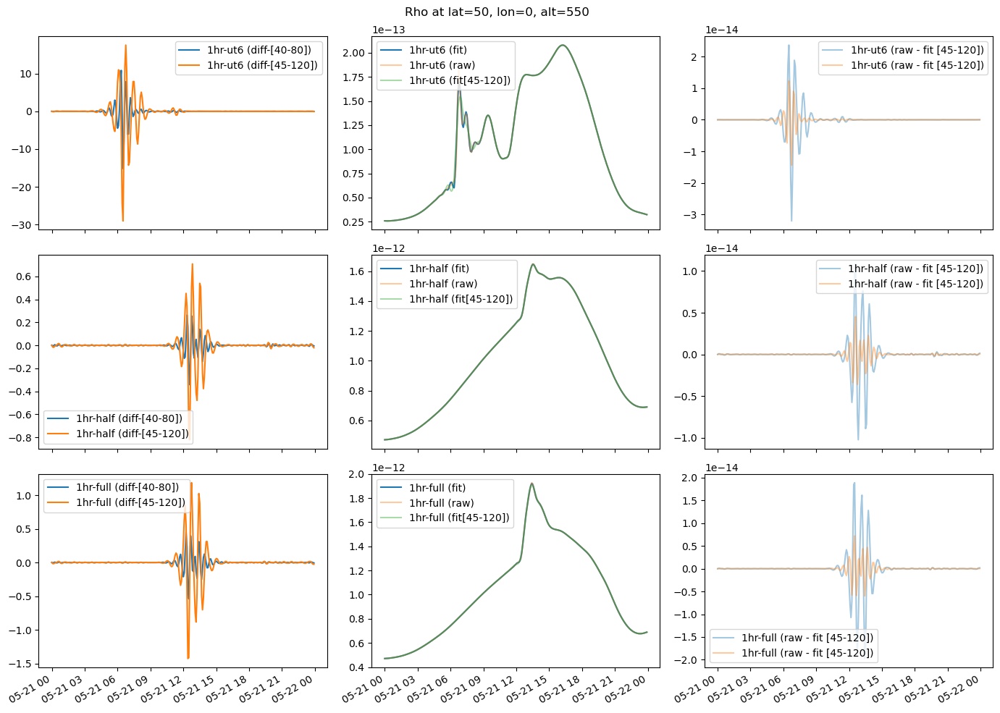

In [43]:
for pt in lonlatalt:
    rows = data['1hr']['may'].keys()
    ilon, ilat, ialt = pt
    fig, axs = plt.subplots(nrows=len(rows), ncols=3,
                            figsize=(14, 1 + len(rows) * 3), sharex = True)

    for row, run in enumerate(rows):
        get_diffs(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 0], label=str(run) + ' (diff-[40-80])')

        get_diffs(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'), lowcut=120, highcut=45).plot(
            ax=axs[row, 0], label=str(run) + ' (diff-[45-120])')

        get_fit(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 1], label=str(run) + ' (fit)')

        data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest').plot(
            ax=axs[row, 1], label=str(run) + ' (raw)', alpha=0.4)

        get_fit(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'), lowcut=120, highcut=45).plot(
            ax=axs[row, 1], label=str(run) + ' (fit[45-120])', alpha=0.4)

        (get_fit(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'), lowcut=120, highcut=45)
         - data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 2], label=str(run) + ' (raw - fit [45-120])', alpha=0.4)
        
        (get_fit(data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest'))
         - data['1hr']['may'][run]['gitm'][plotvar].sel(
            lon=ilon, alt=ialt, lat=ilat, method='nearest')).plot(
            ax=axs[row, 2], label=str(run) + ' (raw - fit [45-120])', alpha=0.4)

    for ax in axs.flatten():
        ax.legend()
        ax.set_title('')
        ax.set_ylabel('')
        ax.set_xlabel('')
    fig.suptitle('%s at lat=%i, lon=%i, alt=%i' %(plotvar, ilat, ilon, ialt))
    fig.tight_layout()
    plt.show()
    break

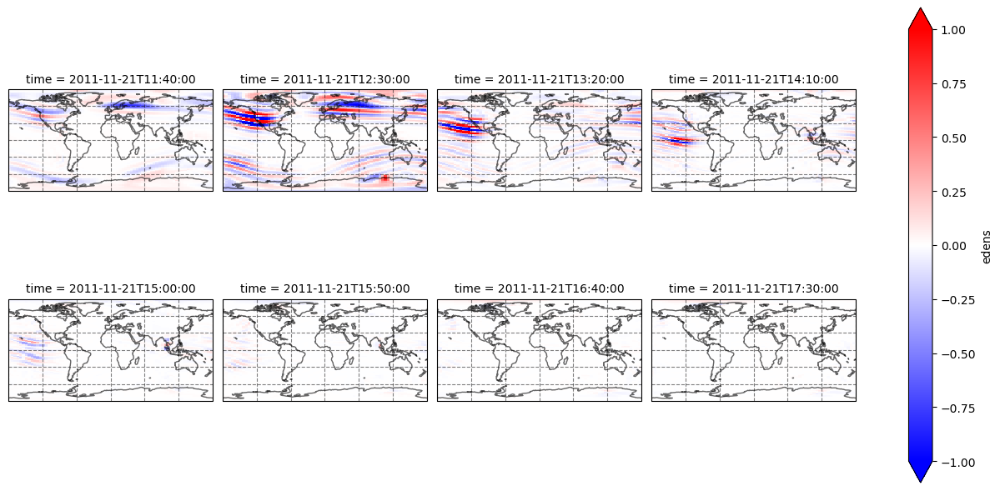

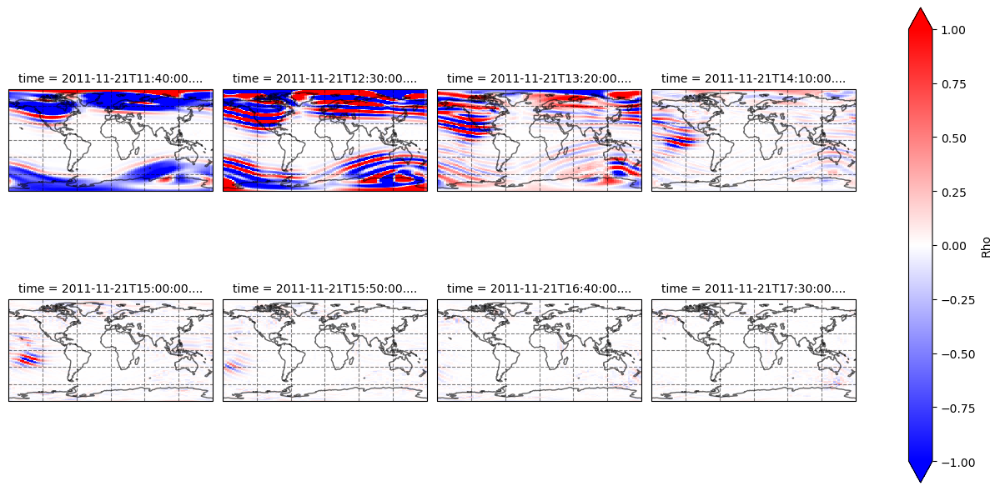

In [136]:
plotting_routines.panel_plot(get_diffs(data['newut']['nov']['full']['sami'].sel(alt=650, method='nearest').edens),
                                 vlims = 1, col_wrap = 4, do_map=True, isel_plotvals=True,
                            wrap_col='time', plot_vals=np.array(afewtimes)+130, x='lon', y='lat')

plotting_routines.panel_plot(get_diffs(data['newut']['nov']['full']['gitm'].sel(alt=650, method='nearest').Rho),
                                 vlims = 1, col_wrap = 4, do_map=True, isel_plotvals=True,
                            wrap_col='time', plot_vals=np.array(afewtimes)+130, x='lon', y='lat')

In [16]:
lons=np.linspace(0,361,8)

In [17]:
a = data['amp']['may']['full']['gitm'].load().copy()

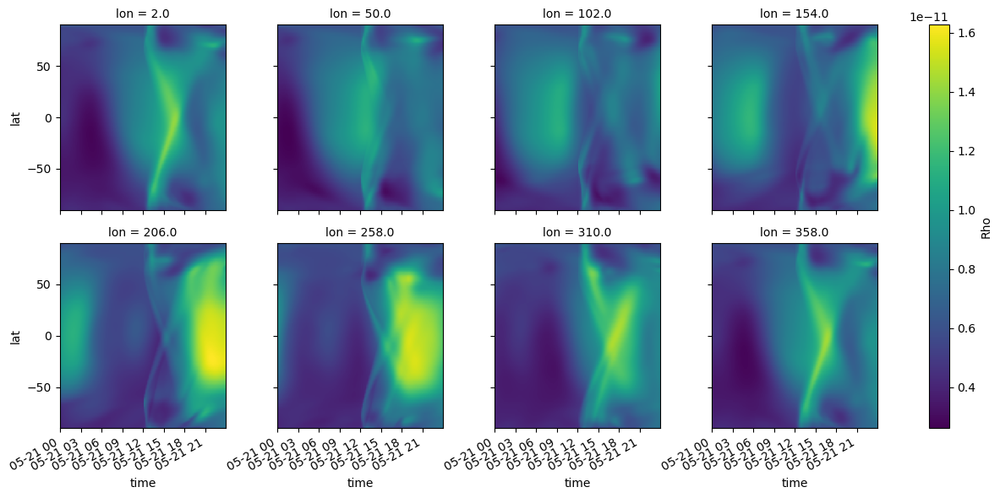

In [19]:
a.Rho.sel(lon=lons.flatten(),alt=400, method='nearest').plot(col_wrap=4, x='time',y='lat', col='lon')

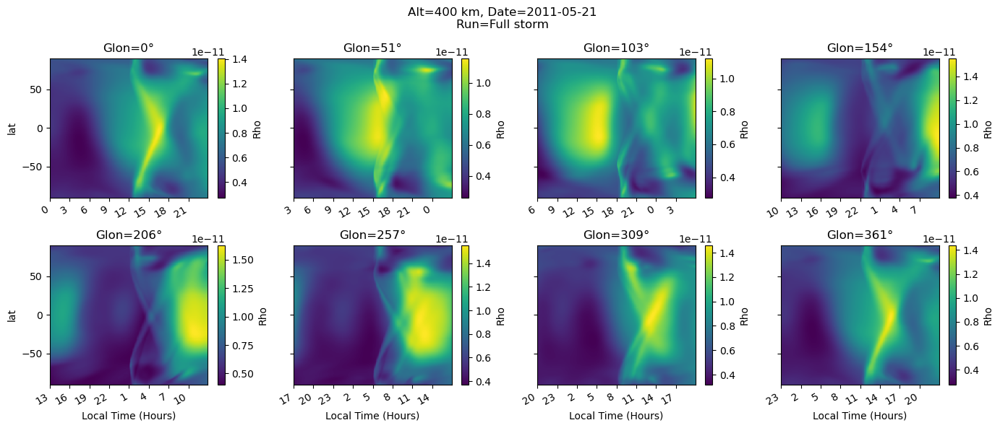

In [20]:


lons = lons.reshape(2,4)


fig, axs = plt.subplots(ncols=4, nrows = 2, sharey=True)
fig.set_size_inches([14,6])

for i in np.ndindex(lons.shape):
    j = a.sel(lon=lons[i],alt=400, method='nearest').copy()

    j.Rho.plot(x='time', y='lat', ax = axs[i])
    axs[i].set_xlabel('Local Time (Hours)')
    tick_locs = axs[i].get_xticks()
    
    axs[i].set_xticks(tick_locs)
    
    lts = utils.ut_to_lt([pd.Timestamp(p) for p in j.time.values[::int(len(j.time.values)/len(tick_locs))]], j.lon.values)
    axs[i].set_xticklabels(lts.astype('int'))
    axs[i].set_title('Glon=%i°' %int(lons[i]))
    
    if i[1] != 0:
        axs[i].set_ylabel('')
    if i[0] !=1:
        axs[i].set_xlabel('')
    
    # if i == (1,0):
    #     break
    

fig.suptitle('Alt=%i km, Date=%s\nRun=%s' %(int(400), str(j.time.dt.date.values[0]), 'Full storm'))
fig.tight_layout()
plt.show()
plt.close()


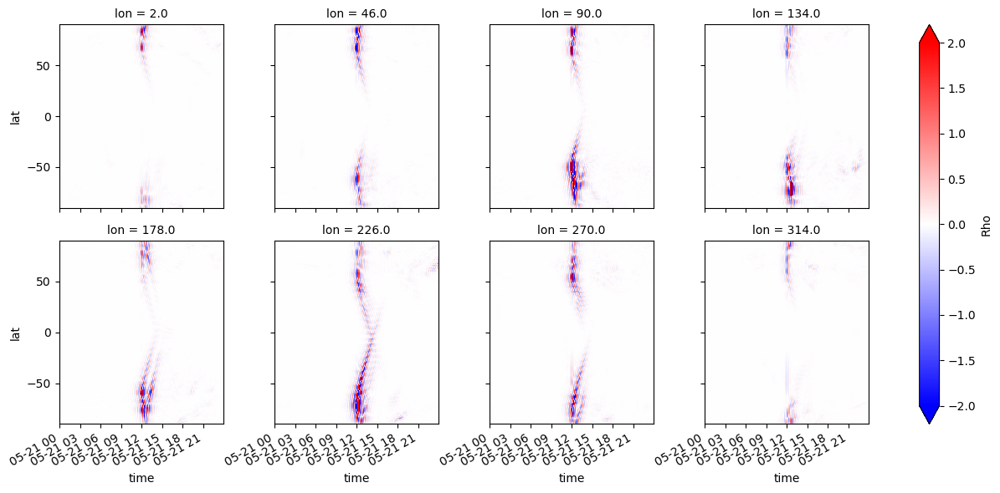

In [21]:
plotting_routines.panel_plot(get_diffs(a.sel(alt=400, method='nearest').Rho),  col_wrap=4)

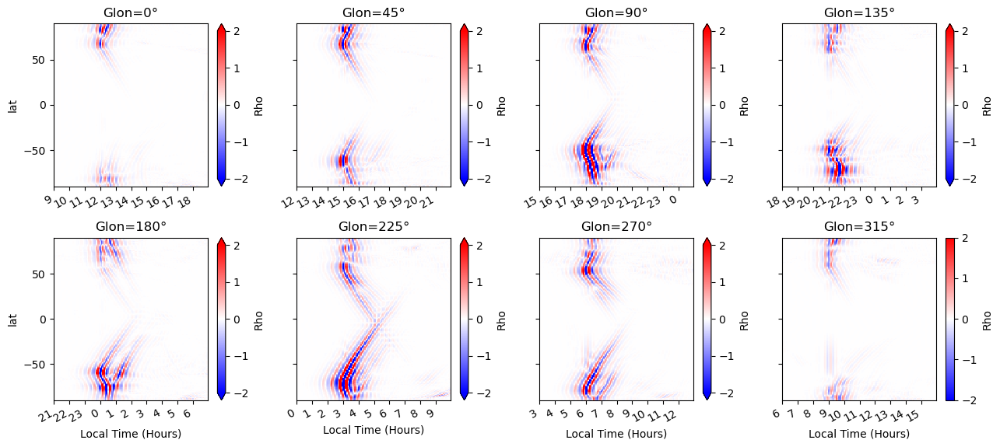

In [22]:
plotting_routines.panel_with_lt(get_diffs(a.Rho.sel(alt=400, method='nearest')).sel(time = slice('2011-5-21 9:00', '2011-05-21 18')), tight_layout=True, vlims=2, col_wrap=4)

In [35]:
a

<xarray.Dataset>
Dimensions:                          (lon: 90, lat: 180, time: 288, alt: 50)
Coordinates:
  * time                             (time) datetime64[ns] 2011-05-21T00:00:0...
  * lon                              (lon) float64 2.0 6.0 10.0 ... 354.0 358.0
  * lat                              (lat) float64 -89.5 -88.5 ... 88.5 89.5
  * alt                              (alt) float64 100.0 101.7 ... 729.0 751.5
Data variables: (12/49)
    LocalTime                        (lon, lat) float64 0.1335 0.1335 ... 23.87
    SolarZenithAngle                 (lon, lat) float64 1.938 1.955 ... 1.221
    VerticalTEC                      (lon, lat) float64 3.235 3.3 ... 32.21
    AltIntJouleHeating_W_m2          (lon, lat) float64 0.0003118 ... 0.001843
    AltIntHeatingTransfer_W_m2       (lon, lat) float64 0.0003732 ... 0.002487
    AltIntEuvHeating_W_m2            (lon, lat) float64 8.814e-08 ... 0.0002843
    ...                               ...
    e_                               (lon, lat, alt) float64 1.269e+10 ... 7....
    eTemperature                     (lon, lat, alt) float64 180.2 ... 2.259e+03
    iTemperature                     (lon, lat, alt) float64 180.2 ... 2.209e+03
    Vi_east                          (lon, lat, alt) float64 -26.06 ... -145.0
    Vi_north                         (lon, lat, alt) float64 -23.04 ... -27.65
    Vi_up                            (lon, lat, alt) float64 15.53 ... -2.739
Attributes:
    version:              21.14
    dropped-ghost-cells:  False
    with_time:            True

In [73]:
utils = importlib.reload(utils)

In [74]:
data_lookup

[['newut', 'nov', 'runs=', ['ut18', 'full', 'ut6']],
 ['newut', 'may', 'runs=', ['ut18', 'full', 'ut6']],
 ['amp', 'nov', 'runs=', ['half', 'full']],
 ['amp', 'may', 'runs=', ['quarter', 'full', 'half']],
 ['rotB',
  'nov',
  'runs=',
  ['bz17', 'bz15-byneg', 'bz8-bypos', 'bz8-byneg', 'bz15-bypos']],
 ['1hr', 'may', 'runs=', ['1hr-ut6', '1hr-half', '1hr-full']]]

In [86]:
plotting_routines.panel_plot(utils.add_lt_to_dataset(data['amp']['may']['full']['gitm'].sel(alt=550, method='nearest').Rho, 90),
                         x='time', y='lat', wrap_col='localtime',col_wrap=4, plot_vals=[2,4,6,8,10,12,14,16])

KeyboardInterrupt: 

In [106]:
a = utils.add_lt_to_dataset(data['amp']['may']['full']['gitm'].sel(alt=550, method='nearest').Rho, 9)

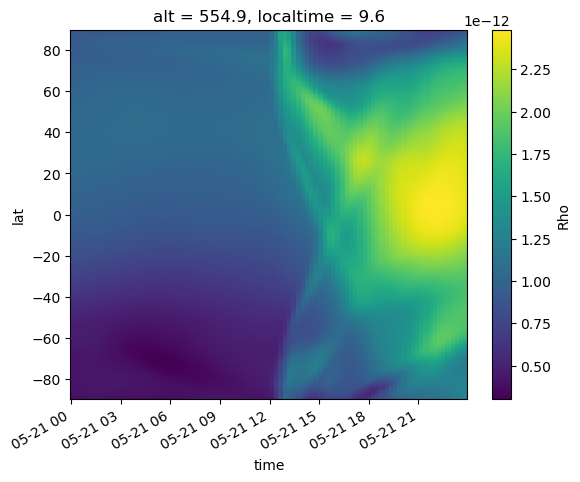

In [107]:
a.isel(localtime=3).plot(x='time')

In [ ]:
a

<xarray.DataArray 'Rho' (localtime: 90, time: 288, lat: 180)>
array([[[3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        [3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        [3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        ...,
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13],
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13],
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13]],

       [[3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
        [3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
        [3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
...
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13],
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13],
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13]],

       [[1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [3.76478140e-13, 3.70920764e-13, 3.66320634e-13, ...,
         8.26777221e-13, 8.59339209e-13, 8.88541020e-13],
        [3.76478140e-13, 3.70920764e-13, 3.66320634e-13, ...,
         8.26777221e-13, 8.59339209e-13, 8.88541020e-13],
        ...,
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13]]])
Coordinates:
    lon        (localtime, time) float64 2.0 2.0 2.0 2.0 ... 358.0 358.0 358.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    alt        float64 554.9
  * localtime  (localtime) float64 0.2637 0.5275 0.7912 ... 23.21 23.47 23.74
  * time       (time) datetime64[ns] 2011-05-21T00:00:00.760000 ... 2011-05-2...

In [130]:
def add_lt_to_dataset(ds,  # xarray.Dataset or xarray.Dataarray
                      localtimes):  # int (for number of localtimes)
    # or list-like for converting those localtimes

    if type(localtimes) == int:
        # Make linspace of localtimes, 0-24, then chop at the ends.
        localtimes = np.linspace(0, 24, localtimes+1,
                                 endpoint=False)[1:]
    else:
        localtimes = np.asarray(localtimes)
    if 'lt' in ds.coords:
        ds = ds.rename('lt', 'localtime')

    elif 'localtime' not in ds.coords:
        ds['localtime'] = (('time', 'lon'),
                           utils.ut_to_lt([pd.Timestamp(i) for i in ds.time.values],
                                          ds.lon))
     
    lt_dss = []

    for t in localtimes:
        ltds = []

        lons_to_iter = np.argmin(np.abs(ds.localtime.values - t), axis=1, )

        for do_lon in lons_to_iter:
            b = ds.isel(lon=do_lon).swap_dims(time='localtime')
            ltds.append(b.interp(localtime=t, method='linear'))

        lt_dss.append(xr.concat(ltds, dim=ds.time))
    return xr.concat(lt_dss, dim='localtime')

In [141]:
g=add_lt_to_dataset(data['amp']['may']['full']['gitm'].sel(alt=550, method='nearest').Rho, 10)
g

<xarray.DataArray 'Rho' (localtime: 10, time: 288, lat: 180)>
array([[[1.26016838e-12, 1.24541154e-12, 1.23777516e-12, ...,
         8.60316776e-13, 8.77185069e-13, 8.76672076e-13],
        [3.79003056e-13, 3.76569959e-13, 3.75096694e-13, ...,
         8.22510944e-13, 8.52775849e-13, 8.77865636e-13],
        [3.79003056e-13, 3.76569959e-13, 3.75096694e-13, ...,
         8.22510944e-13, 8.52775849e-13, 8.77865636e-13],
        ...,
        [1.23433351e-12, 1.21813021e-12, 1.21091332e-12, ...,
         8.34921307e-13, 8.51012776e-13, 8.49605817e-13],
        [1.26016838e-12, 1.24541154e-12, 1.23777516e-12, ...,
         8.60316776e-13, 8.77185069e-13, 8.76672076e-13],
        [1.26016838e-12, 1.24541154e-12, 1.23777516e-12, ...,
         8.60316776e-13, 8.77185069e-13, 8.76672076e-13]],

       [[7.63397111e-13, 7.61276369e-13, 7.57395069e-13, ...,
         8.42262425e-13, 8.61260948e-13, 8.64957828e-13],
        [7.63397111e-13, 7.61276369e-13, 7.57395069e-13, ...,
         8.42262425e-13, 8.61260948e-13, 8.64957828e-13],
        [3.81742194e-13, 3.82317026e-13, 3.82426595e-13, ...,
         8.37493001e-13, 8.59247444e-13, 8.75014788e-13],
...
        [1.26461410e-12, 1.26331527e-12, 1.26719348e-12, ...,
         8.83863618e-13, 8.80572156e-13, 8.59821526e-13],
        [1.26461410e-12, 1.26331527e-12, 1.26719348e-12, ...,
         8.83863618e-13, 8.80572156e-13, 8.59821526e-13],
        [3.74314084e-13, 3.69344153e-13, 3.65264417e-13, ...,
         9.03838589e-13, 9.02150283e-13, 8.90570444e-13]],

       [[3.74897090e-13, 3.68763170e-13, 3.63204702e-13, ...,
         8.61456284e-13, 8.78719510e-13, 8.94476478e-13],
        [3.74897090e-13, 3.68763170e-13, 3.63204702e-13, ...,
         8.61456284e-13, 8.78719510e-13, 8.94476478e-13],
        [3.74897090e-13, 3.68763170e-13, 3.63204702e-13, ...,
         8.61456284e-13, 8.78719510e-13, 8.94476478e-13],
        ...,
        [1.26406423e-12, 1.25488247e-12, 1.25361883e-12, ...,
         8.82148429e-13, 8.78830978e-13, 8.73901685e-13],
        [1.26406423e-12, 1.25488247e-12, 1.25361883e-12, ...,
         8.82148429e-13, 8.78830978e-13, 8.73901685e-13],
        [1.26406423e-12, 1.25488247e-12, 1.25361883e-12, ...,
         8.82148429e-13, 8.78830978e-13, 8.73901685e-13]]])
Coordinates:
    lon        (localtime, time) float64 34.0 30.0 30.0 ... 330.0 330.0 330.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    alt        float64 554.9
  * localtime  (localtime) float64 2.182 4.364 6.545 8.727 ... 17.45 19.64 21.82
  * time       (time) datetime64[ns] 2011-05-21T00:00:00.760000 ... 2011-05-2...

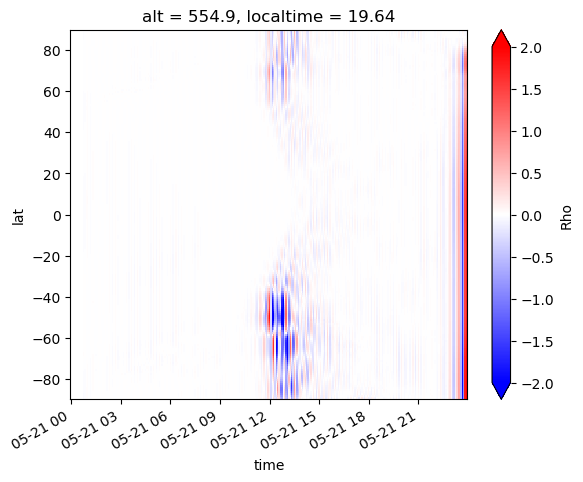

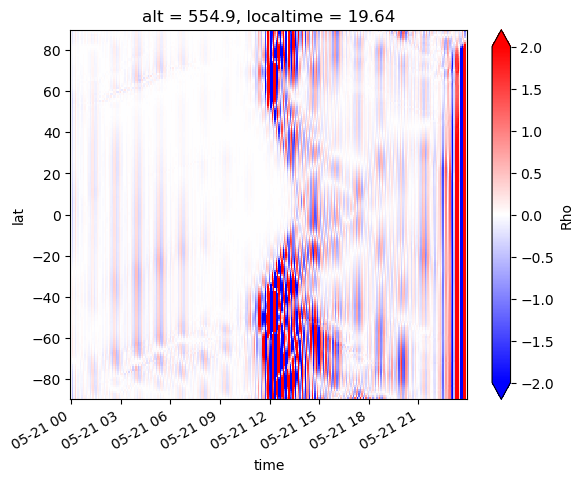

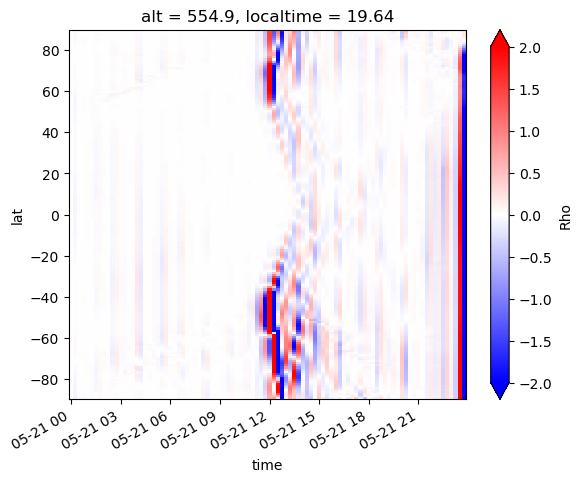

In [153]:
get_diffs(g.isel(localtime=8)).rolling(time=10).mean().plot(vmin=-2, vmax=2, x='time', cmap='bwr')
plt.show()
get_diffs(g.isel(localtime=8)).plot(vmin=-2, vmax=2, x='time', cmap='bwr')

plt.show()

get_diffs(g.isel(localtime=8)).rolling(time=3).mean().interp(time=g.time.values[::3]).plot(vmin=-2, vmax=2, x='time', cmap='bwr')

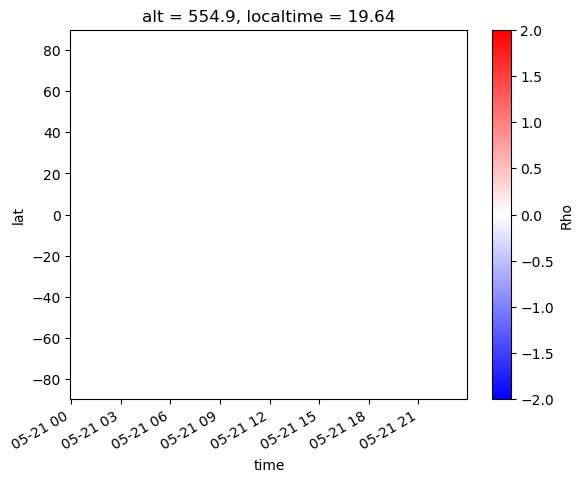

In [138]:
g.plot(x='time', vmin=-2, vmax=2, cmap='bwr', aa=True)

In [ ]:
a.sel(localtime=20, method='nearest').shape

(288, 180)

In [92]:
a

<xarray.DataArray 'Rho' (localtime: 90, time: 288, lat: 180)>
array([[[3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        [3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        [3.76642504e-13, 3.71547238e-13, 3.67436896e-13, ...,
         8.21872809e-13, 8.54838589e-13, 8.84308064e-13],
        ...,
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13],
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13],
        [1.26112713e-12, 1.24355049e-12, 1.23886173e-12, ...,
         8.59878477e-13, 8.77766783e-13, 8.78949144e-13]],

       [[3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
        [3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
        [3.76753442e-13, 3.71943197e-13, 3.68128430e-13, ...,
         8.19922895e-13, 8.52774996e-13, 8.81945452e-13],
...
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13],
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13],
        [1.26538640e-12, 1.24966391e-12, 1.24481049e-12, ...,
         8.71020885e-13, 8.84691231e-13, 8.82567554e-13]],

       [[1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [3.76478140e-13, 3.70920764e-13, 3.66320634e-13, ...,
         8.26777221e-13, 8.59339209e-13, 8.88541020e-13],
        [3.76478140e-13, 3.70920764e-13, 3.66320634e-13, ...,
         8.26777221e-13, 8.59339209e-13, 8.88541020e-13],
        ...,
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13],
        [1.26406904e-12, 1.24753940e-12, 1.24266663e-12, ...,
         8.66543656e-13, 8.81982636e-13, 8.81246308e-13]]])
Coordinates:
    lon        (localtime, time) float64 2.0 2.0 2.0 2.0 ... 358.0 358.0 358.0
  * lat        (lat) float64 -89.5 -88.5 -87.5 -86.5 ... 86.5 87.5 88.5 89.5
    alt        float64 554.9
  * localtime  (localtime) float64 0.2637 0.5275 0.7912 ... 23.21 23.47 23.74
  * time       (time) datetime64[ns] 2011-05-21T00:00:00.760000 ... 2011-05-2...

In [38]:
lts = utils.ut_to_lt([pd.Timestamp(i) for i in a.time.values], a.lon)

In [40]:
lts.shape

(288, 90)

In [39]:
a

<xarray.Dataset>
Dimensions:                          (lon: 90, lat: 180, time: 288, alt: 50)
Coordinates:
  * time                             (time) datetime64[ns] 2011-05-21T00:00:0...
  * lon                              (lon) float64 2.0 6.0 10.0 ... 354.0 358.0
  * lat                              (lat) float64 -89.5 -88.5 ... 88.5 89.5
  * alt                              (alt) float64 100.0 101.7 ... 729.0 751.5
Data variables: (12/49)
    LocalTime                        (lon, lat) float64 0.1335 0.1335 ... 23.87
    SolarZenithAngle                 (lon, lat) float64 1.938 1.955 ... 1.221
    VerticalTEC                      (lon, lat) float64 3.235 3.3 ... 32.21
    AltIntJouleHeating_W_m2          (lon, lat) float64 0.0003118 ... 0.001843
    AltIntHeatingTransfer_W_m2       (lon, lat) float64 0.0003732 ... 0.002487
    AltIntEuvHeating_W_m2            (lon, lat) float64 8.814e-08 ... 0.0002843
    ...                               ...
    e_                               (lon, lat, alt) float64 1.269e+10 ... 7....
    eTemperature                     (lon, lat, alt) float64 180.2 ... 2.259e+03
    iTemperature                     (lon, lat, alt) float64 180.2 ... 2.209e+03
    Vi_east                          (lon, lat, alt) float64 -26.06 ... -145.0
    Vi_north                         (lon, lat, alt) float64 -23.04 ... -27.65
    Vi_up                            (lon, lat, alt) float64 15.53 ... -2.739
Attributes:
    version:              21.14
    dropped-ghost-cells:  False
    with_time:            True

In [45]:
b = xr.Dataset()

In [47]:
b['lat'] = a['lat']
b['alt'] = a['alt']

In [72]:
a['lt'] = (('time', 'lon'), lts)

In [92]:
a.lt

<xarray.DataArray 'lt' (time: 288, lon: 90)>
array([[ 0.13354444,  0.40021111,  0.66687778, ..., 23.33354444,
        23.60021111, 23.86687778],
       [ 0.21669778,  0.48336444,  0.75003111, ..., 23.41669778,
        23.68336444, 23.95003111],
       [ 0.30012472,  0.56679139,  0.83345806, ..., 23.50012472,
        23.76679139,  0.03345806],
       ...,
       [23.88353889,  0.15020556,  0.41687222, ..., 23.08353889,
        23.35020556, 23.61687222],
       [23.96672583,  0.2333925 ,  0.50005917, ..., 23.16672583,
        23.4333925 , 23.70005917],
       [ 0.05015333,  0.31682   ,  0.58348667, ..., 23.25015333,
        23.51682   , 23.78348667]])
Coordinates:
  * time     (time) datetime64[ns] 2011-05-21T00:00:00.760000 ... 2011-05-21T...
  * lon      (lon) float64 2.0 6.0 10.0 14.0 18.0 ... 346.0 350.0 354.0 358.0
    lt       (time, lon) float64 0.1335 0.4002 0.6669 ... 23.25 23.52 23.78

In [102]:
time_lon = []

In [103]:
b = xr.Dataset()

In [99]:

"""


for each local time:

at each time, find closest 2 (or 4) longitudes to the local time we want.

interpolate

""";




In [31]:
lts_plot = np.linspace(0,24,91, endpoint=False)

In [28]:
lts_plot[1:-1], len(lts_plot)

(array([ 0.26373626,  0.52747253,  0.79120879,  1.05494505,  1.31868132,
         1.58241758,  1.84615385,  2.10989011,  2.37362637,  2.63736264,
         2.9010989 ,  3.16483516,  3.42857143,  3.69230769,  3.95604396,
         4.21978022,  4.48351648,  4.74725275,  5.01098901,  5.27472527,
         5.53846154,  5.8021978 ,  6.06593407,  6.32967033,  6.59340659,
         6.85714286,  7.12087912,  7.38461538,  7.64835165,  7.91208791,
         8.17582418,  8.43956044,  8.7032967 ,  8.96703297,  9.23076923,
         9.49450549,  9.75824176, 10.02197802, 10.28571429, 10.54945055,
        10.81318681, 11.07692308, 11.34065934, 11.6043956 , 11.86813187,
        12.13186813, 12.3956044 , 12.65934066, 12.92307692, 13.18681319,
        13.45054945, 13.71428571, 13.97802198, 14.24175824, 14.50549451,
        14.76923077, 15.03296703, 15.2967033 , 15.56043956, 15.82417582,
        16.08791209, 16.35164835, 16.61538462, 16.87912088, 17.14285714,
        17.40659341, 17.67032967, 17.93406593, 18.1

In [32]:
lts_plot[1:]

array([ 0.26373626,  0.52747253,  0.79120879,  1.05494505,  1.31868132,
        1.58241758,  1.84615385,  2.10989011,  2.37362637,  2.63736264,
        2.9010989 ,  3.16483516,  3.42857143,  3.69230769,  3.95604396,
        4.21978022,  4.48351648,  4.74725275,  5.01098901,  5.27472527,
        5.53846154,  5.8021978 ,  6.06593407,  6.32967033,  6.59340659,
        6.85714286,  7.12087912,  7.38461538,  7.64835165,  7.91208791,
        8.17582418,  8.43956044,  8.7032967 ,  8.96703297,  9.23076923,
        9.49450549,  9.75824176, 10.02197802, 10.28571429, 10.54945055,
       10.81318681, 11.07692308, 11.34065934, 11.6043956 , 11.86813187,
       12.13186813, 12.3956044 , 12.65934066, 12.92307692, 13.18681319,
       13.45054945, 13.71428571, 13.97802198, 14.24175824, 14.50549451,
       14.76923077, 15.03296703, 15.2967033 , 15.56043956, 15.82417582,
       16.08791209, 16.35164835, 16.61538462, 16.87912088, 17.14285714,
       17.40659341, 17.67032967, 17.93406593, 18.1978022 , 18.46

In [14]:
dss = []
bouts = []

for t in lts_plot:
    outs = []
    cs = []
    
    times = np.argmin(np.abs(a.lt.values - t), axis = 1)
    
    for do_lon in times:
        b = a.isel(lon=do_lon).sel(alt=400, method='nearest')
        
        # break
        c = b.Rho.swap_dims(time='lt')
        outs.append(c.interp(lt=t))
        # bouts.append(c.interp(lt=t))
        # dss.append(outs)
        # cs.append(c.interp(lt=t))
    bouts.append(xr.concat(outs, dim=a.time))
    # d = np.array(outs)
    
#     plt.figure(figsize=(7,4))
#     plt.imshow(c.T, extent=[pd.Timestamp(a.time.values.min()), pd.Timestamp(a.time.values.max()), a.lat.min(), a.lat.max()], aspect='auto')
#     plt.colorbar()
#     plt.xticks(rotation=-30)
#     plt.xlabel('Time')
#     plt.ylabel('Latitude')
#     plt.title('localtime=' + str(t))
#     plt.show()
#     plt.close()
    # break

NameError: name 'a' is not defined

In [ ]:
ltds = xr.concat(bouts, dim='lt')

In [ ]:
ltds

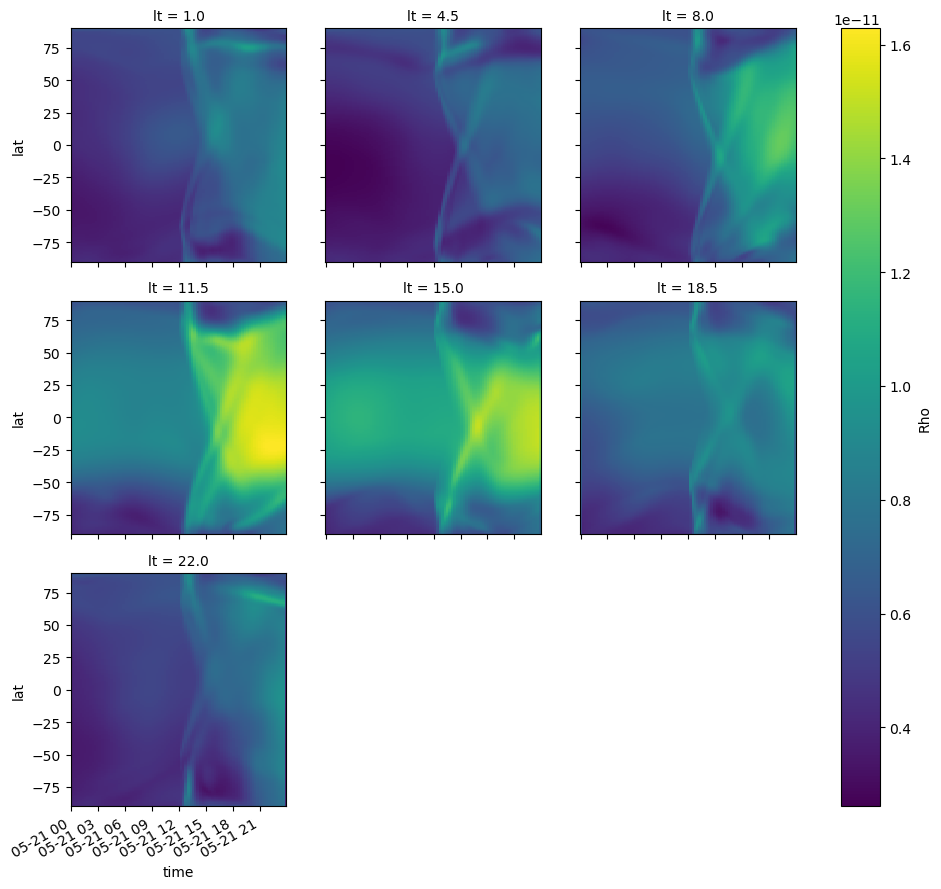

In [305]:
ltds.plot(x='time', col='lt', col_wrap=3)

In [285]:
ltds.sel(lt=5, method='nearest')

KeyError: "no index found for coordinate 'lt'"

In [174]:
outs[0].shape

(180,)

In [175]:
c = np.array(outs)
c.shape

(288, 180)

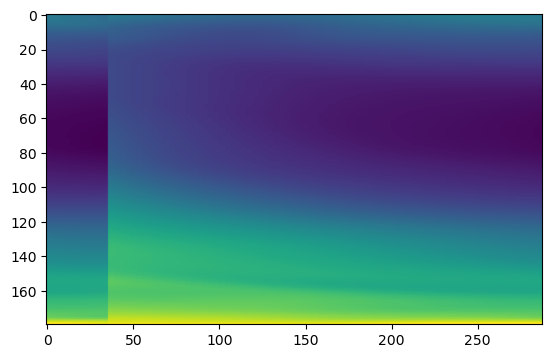

In [178]:
plt.imshow(c.T)

ValueError: The input coordinate is not sorted in increasing order along axis 0. This can lead to unexpected results. Consider calling the `sortby` method on the input DataArray. To plot data with categorical axes, consider using the `heatmap` function from the `seaborn` statistical plotting library.

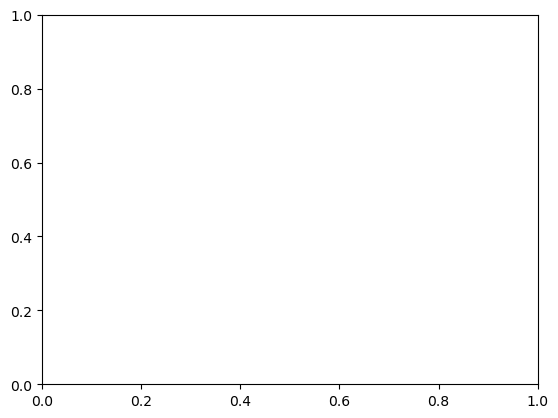

In [165]:
c.plot(x='time', y='lat', xincreasing=False)

In [150]:
times, len(times)

(array([ 34,  31,  28,  25,  22,  18,  15,  12,   9,   6,   2, 287, 284,
        281, 278, 274, 271, 268, 265, 262, 258, 255, 252, 249, 246, 242,
        239, 236, 233, 230, 226, 223, 220, 217, 214, 210, 207, 204, 201,
        198, 194, 191, 188, 185, 182, 178, 175, 172, 169, 166, 162, 159,
        156, 153, 150, 146, 143, 140, 137, 134, 130, 127, 124, 121, 118,
        114, 111, 108, 105, 102,  98,  95,  92,  89,  86,  82,  79,  76,
         73,  70,  66,  63,  60,  57,  54,  50,  47,  44,  41,  38]),
 90)

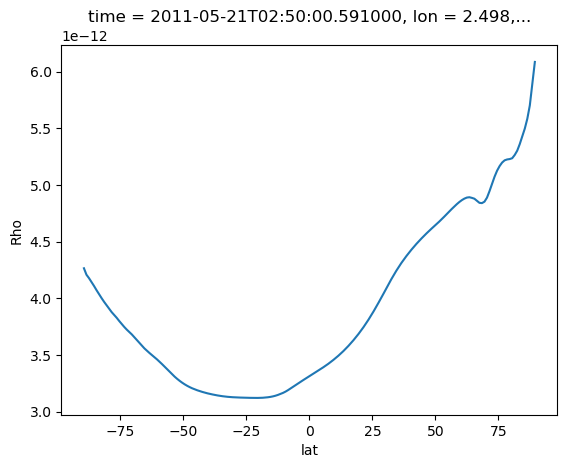

In [151]:
b.Rho.swap_dims(lon='lt').interp(lt=t).plot()

In [112]:
time_lon = xr.concat(time_lon, dim='time')

In [122]:
time_lon.where(time_lon > 0)

<xarray.DataArray 'Rho' (time: 288, lat: 180, alt: 50)>
array([[[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        ...,
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan]],

       [[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
...
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan]],

       [[           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        ...,
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan],
        [           nan,            nan,            nan, ...,
                    nan,            nan,            nan]]])
Coordinates:
  * time     (time) datetime64[ns] 2011-05-21T00:00:00.760000 ... 2011-05-21T...
  * lat      (lat) float64 -89.5 -88.5 -87.5 -86.5 -85.5 ... 86.5 87.5 88.5 89.5
  * alt      (alt) float64 100.0 101.7 103.5 105.4 ... 684.6 706.7 729.0 751.5
    lt       (time) float64 nan nan 11.55 11.55 11.55 ... 6.1 nan nan nan nan
    lon      (time) int64 0 0 62 62 62 62 62 62 63 63 ... 89 89 89 89 89 0 0 0 0

In [88]:
ts = np.argmin(np.abs(a.lt.values - 23), axis=0)

array([274, 271, 268, 265, 262, 258, 255, 252, 249, 246, 242, 239, 236,
       233, 230, 226, 223, 220, 217, 214, 210, 207, 204, 201, 198, 194,
       191, 188, 185, 182, 178, 175, 172, 169, 166, 162, 159, 156, 153,
       150, 146, 143, 140, 137, 134, 130, 127, 124, 121, 118, 114, 111,
       108, 105, 102,  98,  95,  92,  89,  86,  82,  79,  76,  73,  70,
        66,  63,  60,  57,  54,  50,  47,  44,  41,  38,  34,  31,  28,
        25,  22,  18,  15,  12,   9,   6,   2, 287, 284, 281, 278])

In [81]:
len(ts)

288

In [86]:
ts[1: 10]

array([85, 85, 85, 84, 84, 84, 84, 83, 83])

In [83]:
a.isel(time=slice(ts[1],ts[2]))

<xarray.Dataset>
Dimensions:                          (lon: 90, lat: 180, time: 0, alt: 50)
Coordinates:
  * time                             (time) datetime64[ns] 
  * lon                              (lon) float64 2.0 6.0 10.0 ... 354.0 358.0
  * lat                              (lat) float64 -89.5 -88.5 ... 88.5 89.5
  * alt                              (alt) float64 100.0 101.7 ... 729.0 751.5
    lt                               (time, lon) float64 
Data variables: (12/49)
    LocalTime                        (lon, lat) float64 0.1335 0.1335 ... 23.87
    SolarZenithAngle                 (lon, lat) float64 1.938 1.955 ... 1.221
    VerticalTEC                      (lon, lat) float64 3.235 3.3 ... 32.21
    AltIntJouleHeating_W_m2          (lon, lat) float64 0.0003118 ... 0.001843
    AltIntHeatingTransfer_W_m2       (lon, lat) float64 0.0003732 ... 0.002487
    AltIntEuvHeating_W_m2            (lon, lat) float64 8.814e-08 ... 0.0002843
    ...                               ...
    e_                               (lon, lat, alt) float64 1.269e+10 ... 7....
    eTemperature                     (lon, lat, alt) float64 180.2 ... 2.259e+03
    iTemperature                     (lon, lat, alt) float64 180.2 ... 2.209e+03
    Vi_east                          (lon, lat, alt) float64 -26.06 ... -145.0
    Vi_north                         (lon, lat, alt) float64 -23.04 ... -27.65
    Vi_up                            (lon, lat, alt) float64 15.53 ... -2.739
Attributes:
    version:              21.14
    dropped-ghost-cells:  False
    with_time:            True

In [55]:
lt_new = np.linspace(0,24,90)

In [56]:
a.Rho.interp(lt=[lt_new])

ValueError: Dimensions {'lt'} do not exist. Expected one or more of Frozen({'time': 288, 'lon': 90, 'lat': 180, 'alt': 50})